# <b><div style='padding:25px;background-color:#9B2335;color:white;border-radius:4px;font-size:100%;text-align: center'>Singapore  Resale Flat Prices Prediction<br></div>

## <span style="color:Khaki;">Importing required libraries</span>

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np
from scipy.stats import pearsonr,kstest, norm, boxcox
import scipy.stats as stats
from wordcloud import WordCloud, STOPWORDS
from collections import Counter 
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import math
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  
import pickle

## <span style="color:Khaki;">Reading and Understanding the Dataset

In [3]:
df_90_99=pd.read_csv('dataset/ResaleFlatPricesBasedonApprovalDate19901999.csv')
df_00_12=pd.read_csv('dataset/ResaleFlatPricesBasedonApprovalDate2000Feb2012.csv')
df_12_14=pd.read_csv('dataset/ResaleFlatPricesBasedonRegistrationDateFromMar2012toDec2014.csv')
df_15_16=pd.read_csv('dataset/ResaleFlatPricesBasedonRegistrationDateFromJan2015toDec2016.csv')
df_17_=pd.read_csv('dataset/ResaleflatpricesbasedonregistrationdatefromJan2017onwards.csv')

In [4]:
df=pd.concat([df_90_99,df_00_12,df_12_14,df_15_16,df_17_], axis=0)

In [5]:
df.sample(10)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
65184,2020-01,KALLANG/WHAMPOA,4 ROOM,119,MCNAIR RD,01 TO 03,83.0,Simplified,1987,435000.0,66 years 08 months
100513,1995-09,BUKIT BATOK,EXECUTIVE,535,BT BATOK ST 52,04 TO 06,146.0,MAISONETTE,1987,439000.0,NaN
155748,1997-04,MARINE PARADE,4 ROOM,76,MARINE DR,04 TO 06,82.0,IMPROVED,1976,355000.0,NaN
70651,1994-06,BEDOK,5 ROOM,710,BEDOK RESERVOIR RD,01 TO 03,125.0,IMPROVED,1980,283000.0,NaN
232085,2007-04,JURONG EAST,4 ROOM,271,TOH GUAN RD,13 TO 15,101.0,Model A,1999,296000.0,NaN
117509,2003-04,TAMPINES,5 ROOM,361,TAMPINES ST 34,07 TO 09,128.0,Improved,1996,328000.0,NaN
51227,1993-09,YISHUN,4 ROOM,241,YISHUN RING RD,01 TO 03,96.0,NEW GENERATION,1986,122000.0,NaN
157939,1997-05,CLEMENTI,3 ROOM,427,CLEMENTI AVE 3,07 TO 09,67.0,NEW GENERATION,1978,209000.0,NaN
173301,1997-10,YISHUN,4 ROOM,218,YISHUN ST 21,07 TO 09,93.0,NEW GENERATION,1985,270000.0,NaN
241232,1999-03,CHOA CHU KANG,5 ROOM,705,CHOA CHU KANG ST 53,10 TO 12,137.0,MODEL A,1995,361000.0,NaN


In [6]:
print(df.shape)
df.sample(4)

(927465, 11)


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
208739,1998-08,YISHUN,4 ROOM,751,YISHUN ST 72,07 TO 09,91.0,NEW GENERATION,1984,235000.0,NaN
32228,1992-07,BISHAN,5 ROOM,117,BISHAN ST 12,04 TO 06,121.0,IMPROVED,1987,150000.0,NaN
263101,2008-06,BUKIT PANJANG,5 ROOM,539,BT PANJANG RING RD,01 TO 03,120.0,Improved,1999,292000.0,NaN
64492,2001-10,HOUGANG,4 ROOM,658,HOUGANG AVE 8,01 TO 03,107.0,Model A,1987,245000.0,NaN


In [7]:
print(df.dtypes,'\n\n')
df.info()

month                   object
town                    object
flat_type               object
block                   object
street_name             object
storey_range            object
floor_area_sqm         float64
flat_model              object
lease_commence_date      int64
resale_price           float64
remaining_lease         object
dtype: object 


<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                927465 non-null  object 
 1   town                 927465 non-null  object 
 2   flat_type            927465 non-null  object 
 3   block                927465 non-null  object 
 4   street_name          927465 non-null  object 
 5   storey_range         927465 non-null  object 
 6   floor_area_sqm       927465 non-null  float64
 7   flat_model           927465 non-null  object 
 8   lease_commence_date  

### <span style="color:Khaki;">Feature Details:

1. Month - Year and Month of sale of the property.
2. Town - Property Location
3. Flat Type - Property Classification
5. Block - Building contains multiple units/flats
6. Street Name - Property Location
7. Storey Range - Estimated range of floors the unit sold was located on
8. Floor Area SQM - Total Estimated space measured in square meters
9. Flat Model - Classification of units by generation of which the flat was made, ranging from New Generation, DBSS, Improved, Apartment
10. Lease Commence Date - Starting point of a lease agreement, marking the beginning of the lease term during which the tenant has the right to use and occupy the leased property
11. Resale Price - Cost of the flat sold
12. Remaining Lease - remaining lease periond

### <span style="color:Khaki;">Initial Observations:


1. The month column seems to represent a date in 'YYYY-MM' format.
2. The remaining_lease column has mixed data types (both numeric and string values like "45 years 05 months") and NaN values.
3. Most columns contain numeric or categorical data.
5. Other columns may also have missing values (not evident from the sample but should be checked).
6. We could potentially create a new features like:

    - <span style="color: DodgerBlue;font-family:calibri;">**Flat's age**</span>  - by calculating the difference between the current year (2024) and the lease commence year.
    - <span style="color: DodgerBlue;font-family:calibri;">**No of Floors**</span> - by subtracting the Storey range values (Eg data point '5 to 8' then 8-5 = 3).
    - <span style="color: DodgerBlue;font-family:calibri;">**Price per SQM**</span> - by dividing the resale price by floor area sqm
8. Need to verify the clasess in the categorical features to ensure consistency.

9. Need to convert data type for efficient storage.

# <span style="color:Khaki;">Checking Null Values

In [8]:
df.isnull().sum()

month                       0
town                        0
flat_type                   0
block                       0
street_name                 0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
dtype: int64

In [9]:
df.isna().sum()

month                       0
town                        0
flat_type                   0
block                       0
street_name                 0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
dtype: int64

<span style="color: Chartreuse;font-size: 110%">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">We can drop 'Remaining lease' since it contains many null values. Instead, we can create 'Property age,' which may provide similar insights.

In [10]:
df=df.drop(columns='remaining_lease',axis=1)
df.columns

Index(['month', 'town', 'flat_type', 'block', 'street_name', 'storey_range',
       'floor_area_sqm', 'flat_model', 'lease_commence_date', 'resale_price'],
      dtype='object')

## <span style="color:Khaki;">Updating Data types

In [11]:
df['town'] = df['town'].astype('category')
df['flat_type'] = df['flat_type'].astype('category') 
df['block'] = df['block'].astype('category')
df['street_name'] = df['street_name'].astype('category') 
df['storey_range'] = df['storey_range'].astype('category')
df['flat_model'] = df['flat_model'].astype('category')

In [12]:
for i in df.select_dtypes(include='number'):
    print(f'{i}- Min {df[i].min()}---, Max {df[i].max()} ')

floor_area_sqm- Min 28.0---, Max 307.0 
lease_commence_date- Min 1966---, Max 2020 
resale_price- Min 5000.0---, Max 1588000.0 


In [13]:
df['floor_area_sqm'] = df['floor_area_sqm'].astype('float32')
df['lease_commence_date'] = df['lease_commence_date'].astype('int32')
df['month'] = pd.to_datetime(df['month'], format='%Y-%m', errors='coerce')
df['month'] = pd.to_datetime(df['month'], format='%Y-%m')

In [14]:
for i in df.select_dtypes(exclude='number'):
    print(f'{i}- {df[i].value_counts().count()}\n ')

month- 414
 
town- 27
 
flat_type- 8
 
block- 2711
 
street_name- 584
 
storey_range- 25
 
flat_model- 34
 


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   month                927465 non-null  datetime64[ns]
 1   town                 927465 non-null  category      
 2   flat_type            927465 non-null  category      
 3   block                927465 non-null  category      
 4   street_name          927465 non-null  category      
 5   storey_range         927465 non-null  category      
 6   floor_area_sqm       927465 non-null  float32       
 7   flat_model           927465 non-null  category      
 8   lease_commence_date  927465 non-null  int32         
 9   resale_price         927465 non-null  float64       
dtypes: category(6), datetime64[ns](1), float32(1), float64(1), int32(1)
memory usage: 35.5 MB


In [16]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
month,927465,2006-08-20 18:43:29.075706368,1990-01-01 00:00:00,1999-01-01 00:00:00,2005-04-01 00:00:00,2014-03-01 00:00:00,2024-06-01 00:00:00,NaN
floor_area_sqm,927465.0,95.691246,28.0,73.0,93.0,113.0,307.0,25.824986
lease_commence_date,927465.0,1988.278012,1966.0,1981.0,1986.0,1996.0,2020.0,10.664813
resale_price,927465.0,320848.058806,5000.0,193000.0,297500.0,418000.0,1588000.0,170522.857301


<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">The Data Frame size reduced by 58% </span></span><br>
<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">We have data from the year 1990 to 2024.</span></span><br>
<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">Large gaps between the 75th percentile and maximum values in floor area and resale price suggest outliers. However, factors like Year, storey range, flat type, and model may also affect price. Careful outlier analysis is required.</span></span><br>
<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">The minimum value in the resale price 
of 5,000 also suggests possible data entry errors or highly undervalued sales.</span></span><br>

### Checking Categorical feature Classess <span style="color:Khaki;">

In [17]:
for i in df.select_dtypes(include='category'):
    print('-----'*10,'\n',df[i].value_counts().reset_index().sort_values(by=i,ascending=True),'\n','-----'*10)

-------------------------------------------------- 
                town  count
5        ANG MO KIO  52090
3             BEDOK  66677
20           BISHAN  21271
7       BUKIT BATOK  44429
9       BUKIT MERAH  34383
16    BUKIT PANJANG  27708
25      BUKIT TIMAH   2519
24     CENTRAL AREA   7150
8     CHOA CHU KANG  38348
15         CLEMENTI  28040
14          GEYLANG  28179
6           HOUGANG  50772
18      JURONG EAST  24796
2       JURONG WEST  66715
17  KALLANG/WHAMPOA  27199
26     LIM CHU KANG     64
23    MARINE PARADE   8041
10        PASIR RIS  33237
21          PUNGGOL  20665
13       QUEENSTOWN  28784
22        SEMBAWANG  13869
11         SENGKANG  32488
19        SERANGOON  22835
0          TAMPINES  80005
12        TOA PAYOH  31541
4         WOODLANDS  65563
1            YISHUN  70097 
 --------------------------------------------------
-------------------------------------------------- 
           flat_type   count
5            1 ROOM    1304
4            2 ROOM   11841
1

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">In the Flat Type and Flat Model variable we see case inconsistency classes (Same class in upper case and lower case). It creates duplicate classes. Better we address this in all categorical column. </span></span><br>

### <p style="color: Khaki;">Cleaning Case and Text inconsistency </p>

In [18]:
for col in df.select_dtypes(include='category'):
    if 'block' not in i:
        df[col] = df[col].str.strip().str.title()
        df[col].describe()
        print(df[col].describe(),'\n\n',df[col].value_counts().reset_index().sort_values(by=col,ascending=True),'\n','-----'*10)

count       927465
unique          27
top       Tampines
freq         80005
Name: town, dtype: object 

                town  count
5        Ang Mo Kio  52090
3             Bedok  66677
20           Bishan  21271
7       Bukit Batok  44429
9       Bukit Merah  34383
16    Bukit Panjang  27708
25      Bukit Timah   2519
24     Central Area   7150
8     Choa Chu Kang  38348
15         Clementi  28040
14          Geylang  28179
6           Hougang  50772
18      Jurong East  24796
2       Jurong West  66715
17  Kallang/Whampoa  27199
26     Lim Chu Kang     64
23    Marine Parade   8041
10        Pasir Ris  33237
21          Punggol  20665
13       Queenstown  28784
22        Sembawang  13869
11         Sengkang  32488
19        Serangoon  22835
0          Tampines  80005
12        Toa Payoh  31541
4         Woodlands  65563
1            Yishun  70097 
 --------------------------------------------------
count     927465
unique         8
top       4 Room
freq      352489
Name: flat_type, d

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">Standardizing the text case solved most of the problem but we can see text inconsistency in the Flat Type variable, let's clear it.</span></span><br>

In [19]:
df['flat_type'].value_counts().reset_index().sort_values(by='count',ascending=False)

,flat_type,count
0,4 Room,352489
1,3 Room,296064
2,5 Room,195520
3,Executive,69704
4,2 Room,11841
5,1 Room,1304
6,Multi Generation,279
7,Multi-Generation,264


In [20]:
df['flat_type'] = df['flat_type'].apply(lambda x: x.strip().replace('-', ' '))

In [21]:
df['flat_type'].value_counts().reset_index().sort_values(by='count',ascending=False)

,flat_type,count
0,4 Room,352489
1,3 Room,296064
2,5 Room,195520
3,Executive,69704
4,2 Room,11841
5,1 Room,1304
6,Multi Generation,543


<p style="color: Khaki;">

## <p Style="color: Khaki"> Feature Engineering

### <p Style="color: Khaki"> Variable Simplification/Agrregation/Transformation:</p>

In [24]:
df['floors']= df['storey_range'].apply(lambda x: (int(x.split(' To ')[1]) - int(x.split(' To ')[0]))+1)
df['floor_no']= df['storey_range'].apply(lambda x: int(x.split(' To ')[-1])).astype('int8')
df=df.drop(columns='storey_range')

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">Changed the storey_range from a string range to a numeric span for easy accessible. </span></span><br><span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">Keeping floor level is important as it may also influence the sale price. </span></span><br>

In [25]:
df['year'] = df['month'].dt.year
df['month'] = df['month'].dt.month

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">Separated Year and Month variable from month variable. </span></span><br>

### <p Style="color: Khaki"> Creating New Features

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                927465 non-null  int32  
 1   town                 927465 non-null  object 
 2   flat_type            927465 non-null  object 
 3   block                927465 non-null  object 
 4   street_name          927465 non-null  object 
 5   floor_area_sqm       927465 non-null  float32
 6   flat_model           927465 non-null  object 
 7   lease_commence_date  927465 non-null  int32  
 8   resale_price         927465 non-null  float64
 9   floors               927465 non-null  int64  
 10  floor_no             927465 non-null  int8   
 11  year                 927465 non-null  int32  
dtypes: float32(1), float64(1), int32(3), int64(1), int8(1), object(5)
memory usage: 71.6+ MB


In [27]:
df['full_address'] = df['block'].astype(str) + " " + df['street_name'].astype(str) + " " + df['town']

In [28]:
df[['block','street_name','town','full_address']].describe()

,block,street_name,town,full_address
count,927465,927465,927465,927465
unique,2711,584,27,9836
top,2,Yishun Ring Rd,Tampines,211 Boon Lay Pl Jurong West
freq,4590,17606,80005,822


In [29]:
df = df.drop(columns=['block','street_name'])

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">Combining Block, Street, and Town into a single "full address" captures the precise influence of location on price better than treating these features separately.Treating each component of the address separately (block, street, town) can increase the complexity of the model</span></span><br>

In [30]:
if 'floor_area_sqm' in df.columns:
  df['price_per_sqm'] = np.where(df['floor_area_sqm'] > 0, df['resale_price'] / df['floor_area_sqm'], np.nan)
else:
  df['price_per_sqm'] = np.nan

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%">Calculating price per SQM may help provide insights about price influence, Identifying Outliers, and analyze price trends It helps remove the influence of overall property size and allows you to focus on the price difference based purely on location. </span></span><br>

In [31]:
df['remaining_lease_year'] = df['lease_commence_date'] + 99 - df['year'].astype('int')

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 130%"> It may provide the approximate age of the property which is also a price influencer.</span></span><br>

In [32]:
df[['full_address','year','month','remaining_lease_year','floors','lease_commence_date','flat_type','flat_model','town']] = df[['full_address','year','month','remaining_lease_year','floors','lease_commence_date','flat_type','flat_model','town']].apply(lambda x: x.astype('category'))

## <p style="color: Khaki;"> Analyzing Data Frame after data cleaning </p>

In [33]:
print(df.info())
df.sample(5)

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 13 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   month                 927465 non-null  category
 1   town                  927465 non-null  category
 2   flat_type             927465 non-null  category
 3   floor_area_sqm        927465 non-null  float32 
 4   flat_model            927465 non-null  category
 5   lease_commence_date   927465 non-null  category
 6   resale_price          927465 non-null  float64 
 7   floors                927465 non-null  category
 8   floor_no              927465 non-null  int8    
 9   year                  927465 non-null  category
 10  full_address          927465 non-null  category
 11  price_per_sqm         927465 non-null  float64 
 12  remaining_lease_year  927465 non-null  category
dtypes: category(9), float32(1), float64(2), int8(1)
memory usage: 34.8 MB
None


,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,floors,floor_no,year,full_address,price_per_sqm,remaining_lease_year
152084,4,Yishun,3 Room,68.0,Model A,2018,445000.0,3,12,2023,675D Yishun Ave 4 Yishun,6544.117647,94
212287,7,Kallang/Whampoa,5 Room,122.0,Improved,1999,380000.0,3,15,2006,13 Upp Boon Keng Rd Kallang/Whampoa,3114.754098,92
129252,9,Yishun,4 Room,105.0,Model A,1985,207000.0,3,9,2003,132 Yishun St 11 Yishun,1971.428571,81
11346,5,Jurong West,4 Room,106.0,Model A,1996,232500.0,3,3,2000,864 Jurong West St 81 Jurong West,2193.396226,95
62395,11,Yishun,5 Room,112.0,Improved,2015,501000.0,3,9,2019,426A Yishun Ave 11 Yishun,4473.214286,95


In [34]:
print(df.isnull().sum(),'\n\n',df.isna().sum())

month                   0
town                    0
flat_type               0
floor_area_sqm          0
flat_model              0
lease_commence_date     0
resale_price            0
floors                  0
floor_no                0
year                    0
full_address            0
price_per_sqm           0
remaining_lease_year    0
dtype: int64 

 month                   0
town                    0
flat_type               0
floor_area_sqm          0
flat_model              0
lease_commence_date     0
resale_price            0
floors                  0
floor_no                0
year                    0
full_address            0
price_per_sqm           0
remaining_lease_year    0
dtype: int64


In [35]:
df.columns

Index(['month', 'town', 'flat_type', 'floor_area_sqm', 'flat_model',
       'lease_commence_date', 'resale_price', 'floors', 'floor_no', 'year',
       'full_address', 'price_per_sqm', 'remaining_lease_year'],
      dtype='object')

In [36]:
num=df.select_dtypes(include=['number']).columns
for col in num:
    print(f"{col} -  {(df[col] <= 0).sum()}")

floor_area_sqm -  0
resale_price -  0
floor_no -  0
price_per_sqm -  0


## <p style="color: Khaki;">Exporting Data Frame

In [37]:
df.to_csv('df1.csv',index=False)

In [38]:
df.to_feather('df1.feather')

In [39]:
continuous = ['floor_area_sqm', 'resale_price','price_per_sqm']
# discrete = ['lease_commence_date', 'year', 'month_number']
# nominal = ['month', 'town', 'flat_type', 'block', 'street_name', 'flat_model', 'full_address']
# ordinal = ['storey_range', 'remaining_lease']
categorical = ['year','month_number' ,'town', 'flat_type',
       'flat_model','storey_range','lease_commence_date','remaining_lease_year','floor_area_category']

## Exploratory Data Analysis. Before Handling Skewness and Outliers

In [40]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]

    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=50,color='maroon',fill=True)
    plt.title(f'Histogram for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}')

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

### Numerical features Distribution

In [41]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
floor_area_sqm,927465.0,95.691246,25.824986,28.000000,73.00000,93.000000,113.0,3.070000e+02
lease_commence_date,927465.0,1988.278012,10.664813,1966.000000,1981.00000,1986.000000,1996.0,2.020000e+03
resale_price,927465.0,320848.058806,170522.857301,5000.000000,193000.00000,297500.000000,418000.0,1.588000e+06
price_per_sqm,927465.0,3318.137732,1532.133749,161.290323,2292.26087,2956.521739,4200.0,1.559140e+04
year,927465.0,2006.174394,9.324771,1990.000000,1999.00000,2005.000000,2014.0,2.024000e+03
month_number,927465.0,6.550482,3.413028,1.000000,4.00000,7.000000,10.0,1.200000e+01
remaining_lease_year,927465.0,81.103618,10.717863,41.000000,74.00000,83.000000,90.0,1.010000e+02


In [42]:
def kurtosis_color(kurt_val):
    if -1 <= kurt_val <= 1:
        kurt_color = color_good  # Dark Green for near-zero kurtosis (good)
    elif 1 < kurt_val <= 3 or -3 <= kurt_val < -1:
        kurt_color = color_okay  # Yellow for moderate kurtosis
    else:  # kurt_val > 3 or kurt_val < -3
        kurt_color = color_bad  # Maroon for extreme kurtosis
    return kurt_color

def skewness_color(skew_val):
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
    return color

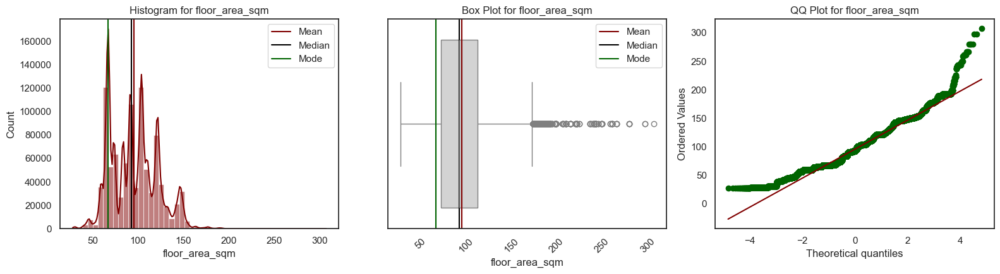



Skew for floor_area_sqm is 0.3661
Kurtosis for floor_area_sqm is -0.3464




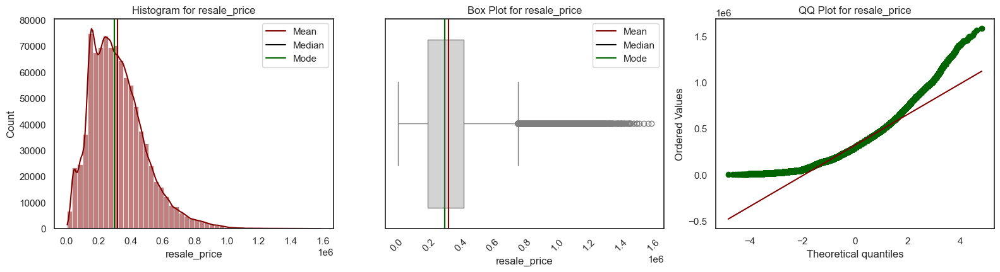



Skew for resale_price is 0.9422
Kurtosis for resale_price is 1.3735




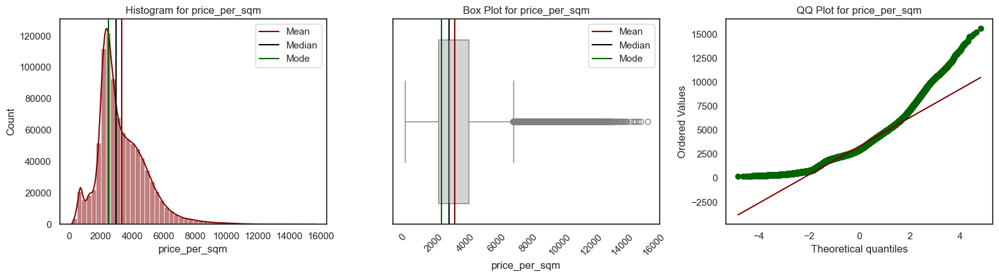



Skew for price_per_sqm is 1.0728
Kurtosis for price_per_sqm is 2.0849




In [43]:
color_good = '\033[32m'   # Dark Green for near-zero skew
color_okay = '\033[92m'   # Light Green for slightly positive or slightly negative skew
color_bad = '\033[91m'    # Maroon for significant skew
color_neutral = '\033[0m' # Reset color

skewed_col = []

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  

for i in continuous:
    univar_num(df1,i) 
    skew_val = df1[i].skew()
    kurt=df1[i].kurtosis()
    kurt_color = kurtosis_color(kurt)
    color = skewness_color(skew_val)
    skewed_col.append(i)

    print(f"\n\n{color}Skew for {i} is {skew_val:.4f}{color_neutral}")
    print(f"{color}Kurtosis for {i} is {kurt:.4f}{color_neutral}\n\n")

### Categorical features Distribution

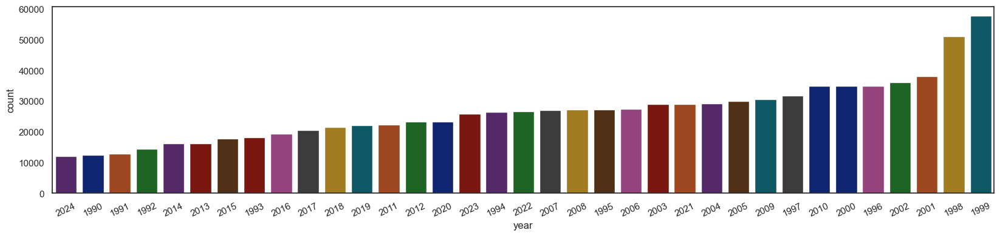

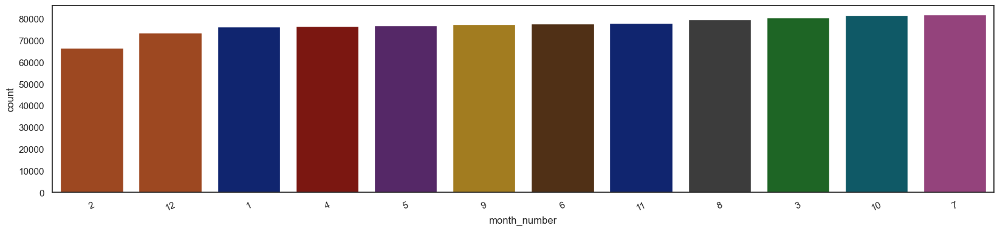

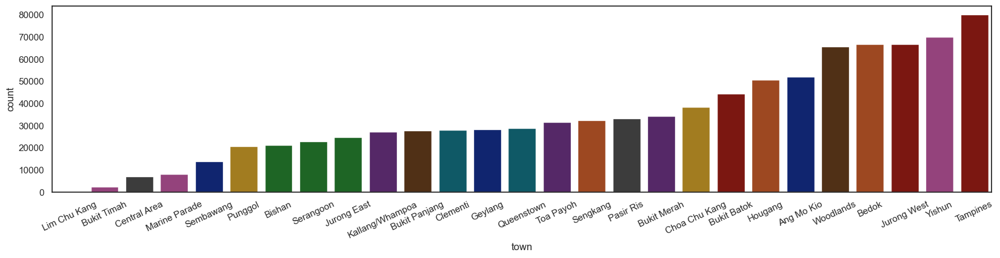

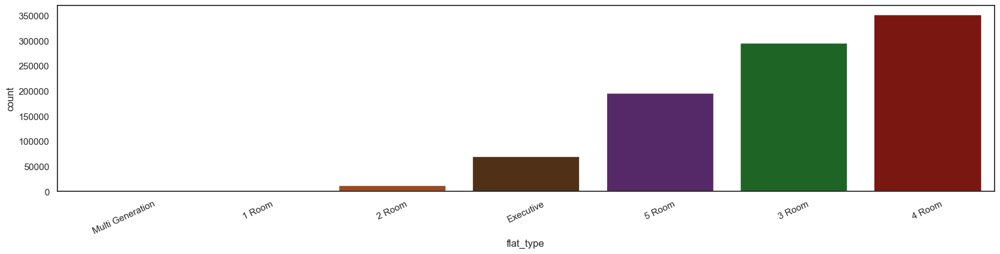

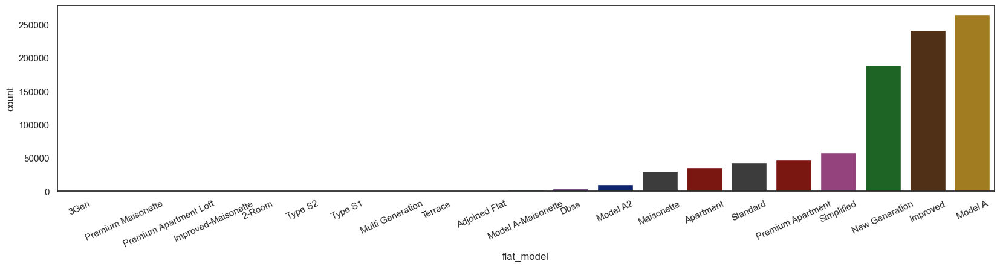

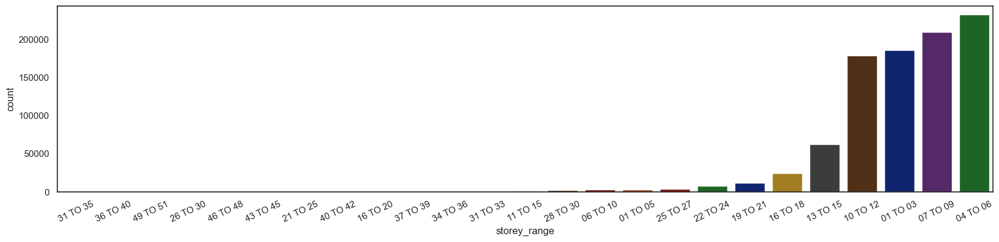

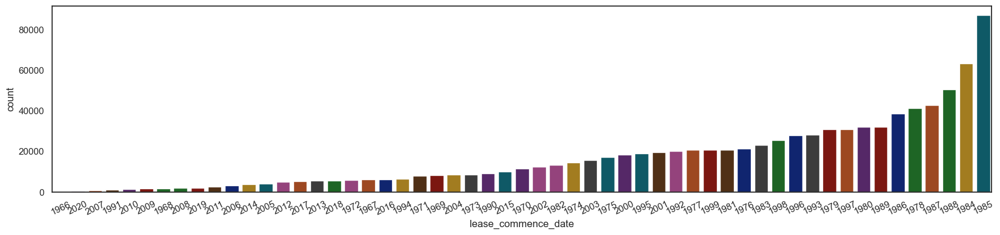

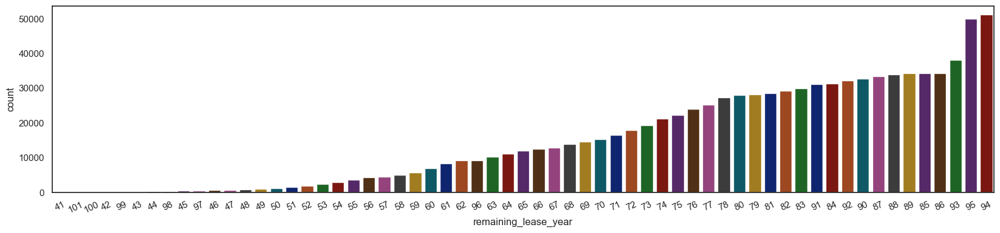

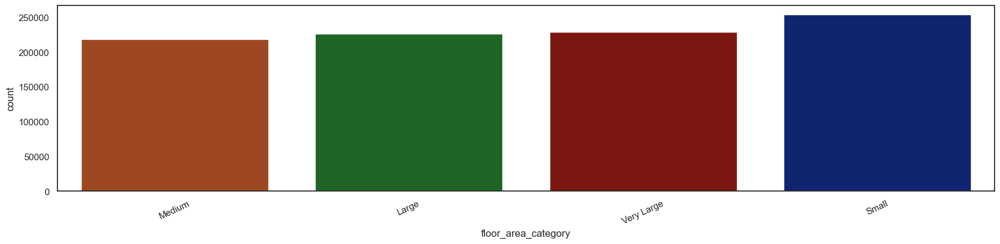

In [44]:
for i in categorical:
    plt.figure(figsize=(20, 4))
    sns.countplot(data=df1, x=df1[i], hue=i, order = df1[i].value_counts().index.tolist()[::-1],palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.show()

### Outliers based on the Categorical 

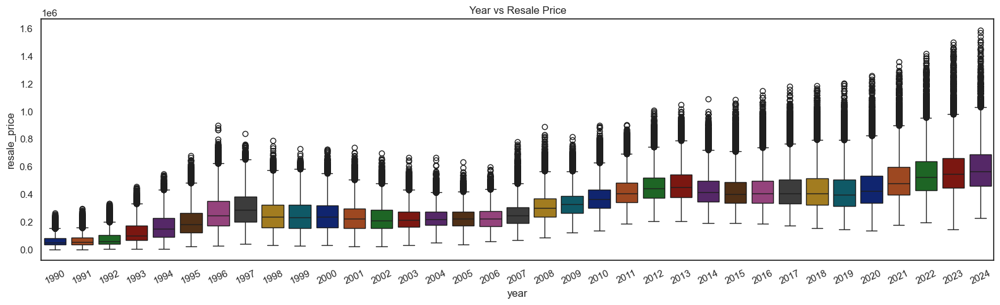

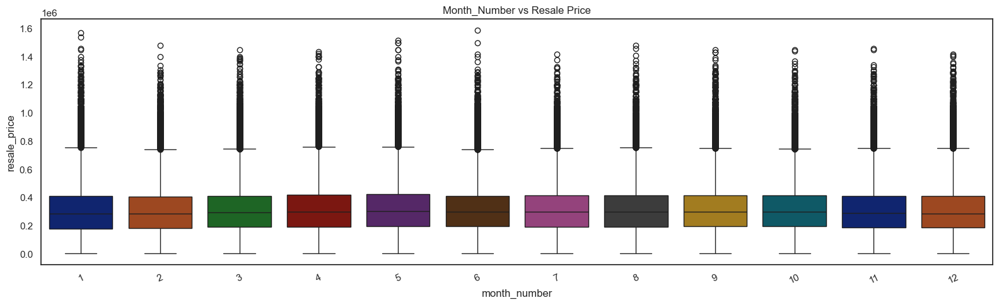

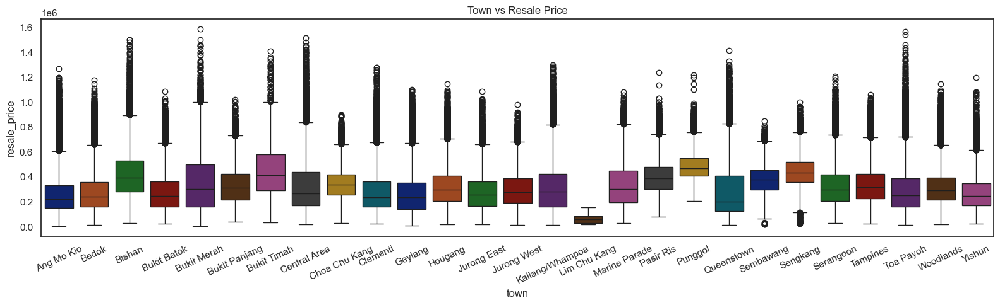

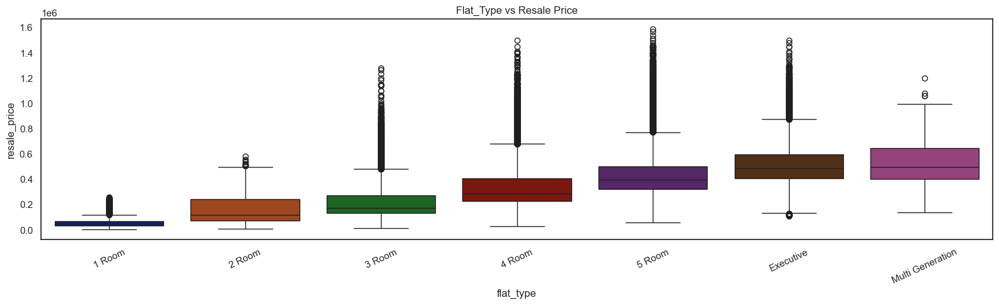

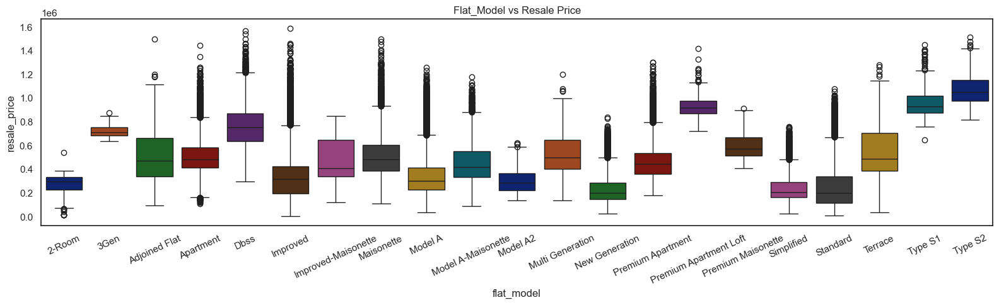

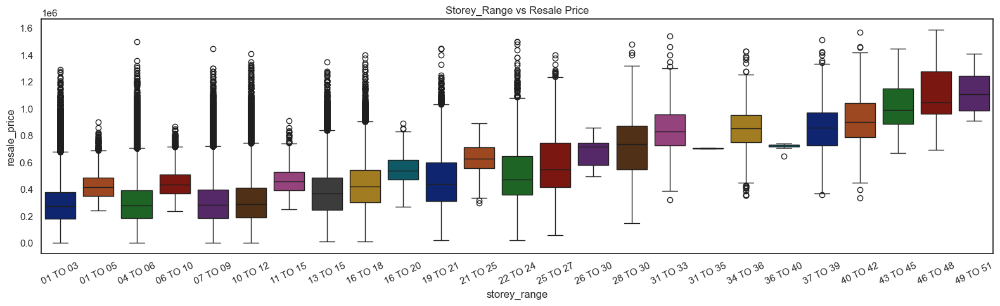

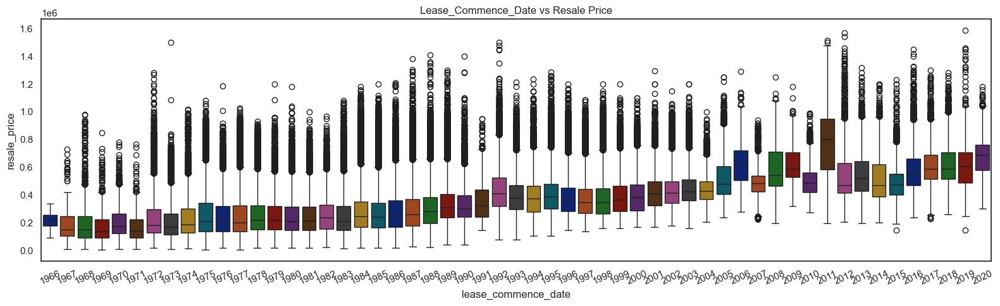

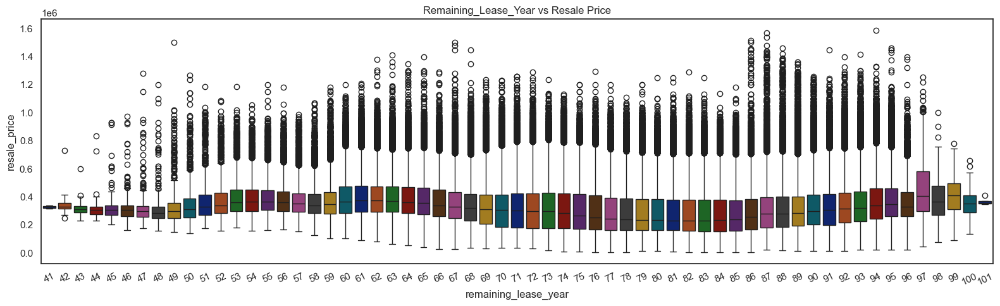

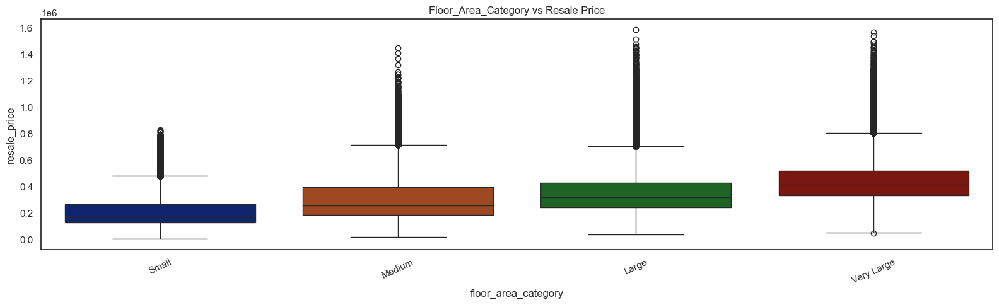

In [45]:
for i in categorical:
    plt.figure(figsize=(16,5))
    sns.boxplot(data=df1,x=i,y="resale_price",hue=i,palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Resale Price')
    plt.tight_layout()
    plt.show()

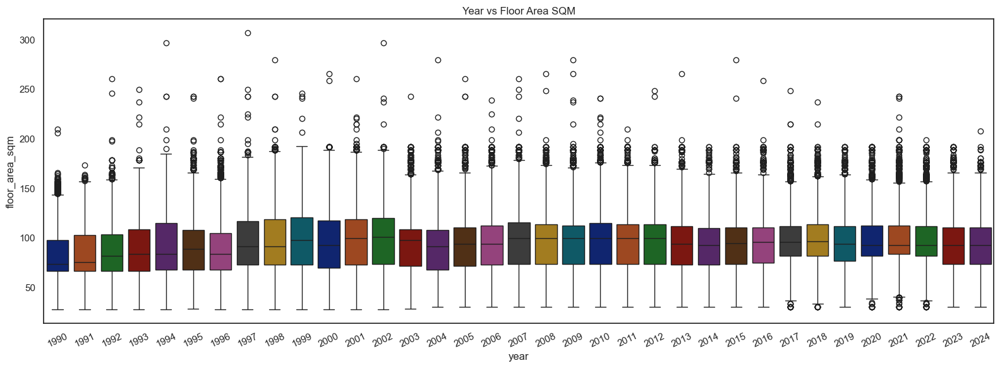

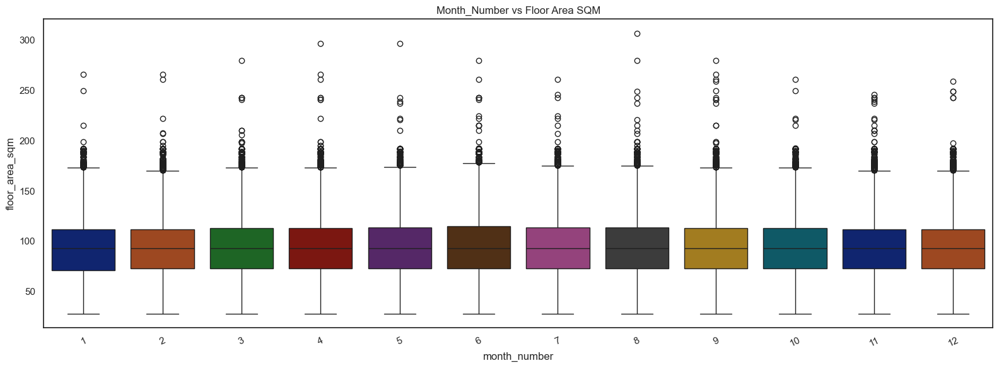

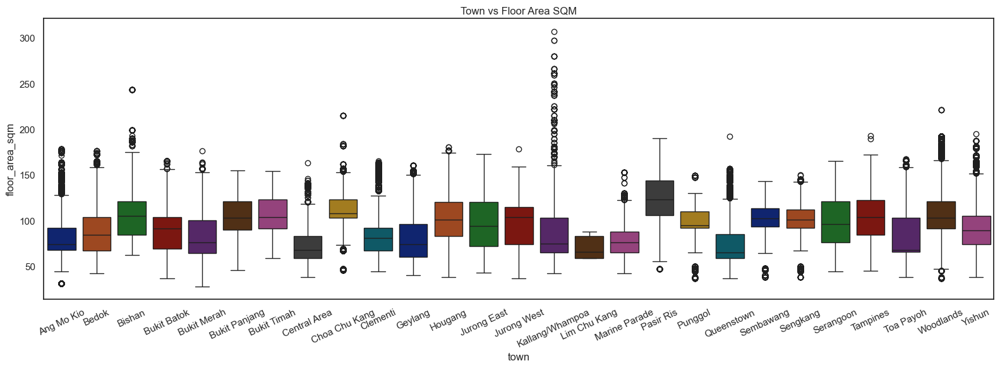

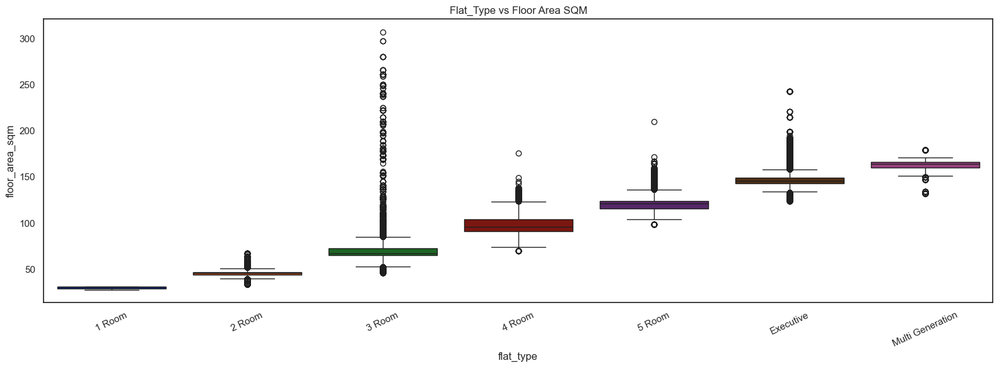

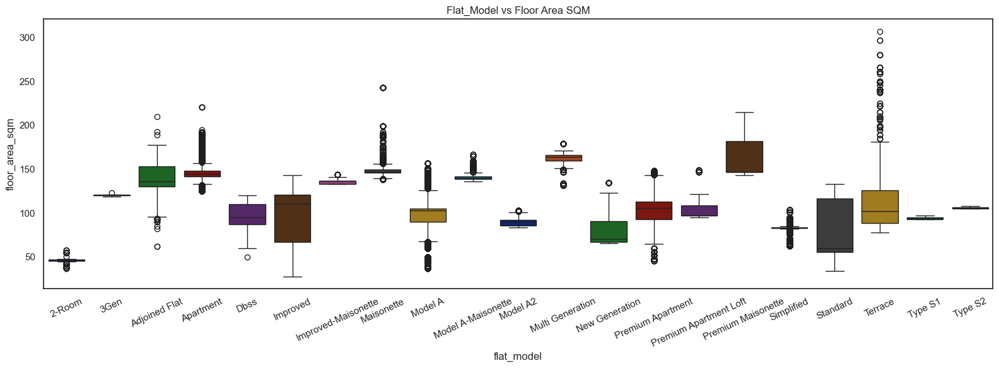

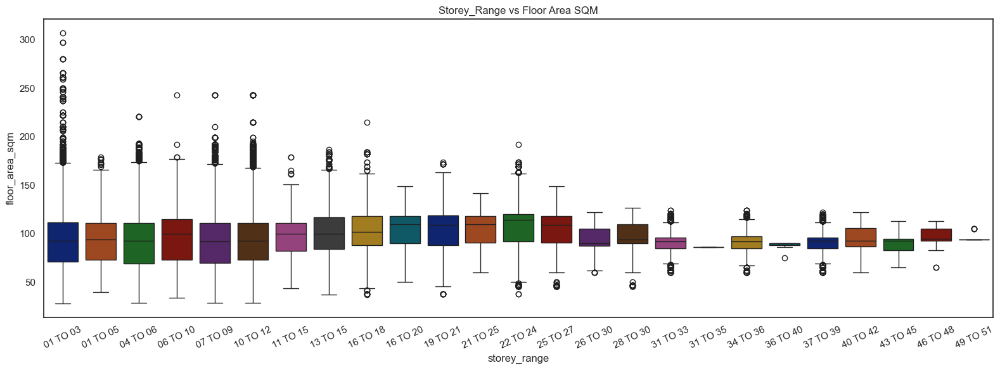

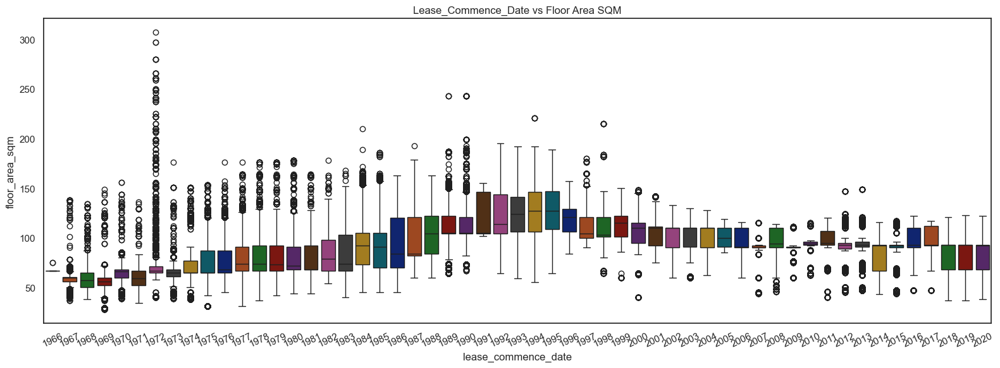

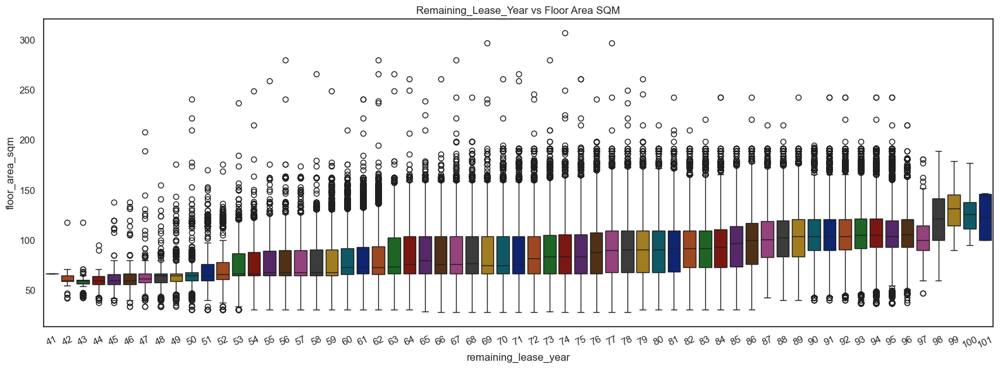

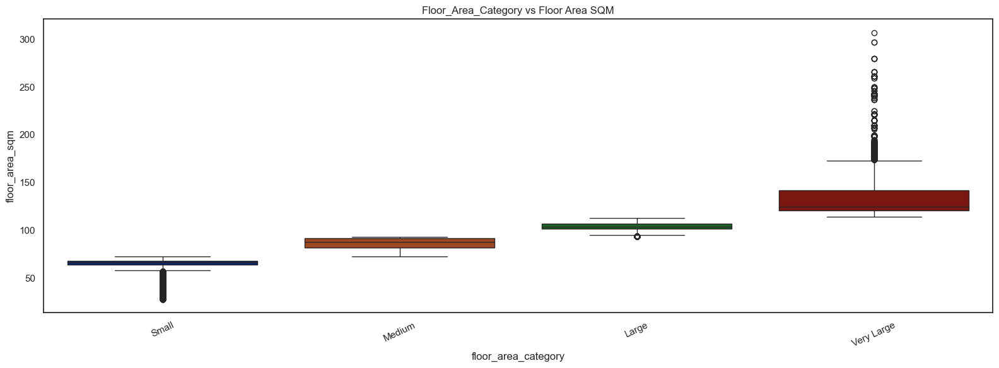

In [46]:
for i in categorical:
    plt.figure(figsize=(16,6))
    sns.boxplot(data=df1,x=i,y="floor_area_sqm",hue=i,palette='dark',legend=False,)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Floor Area SQM')
    plt.tight_layout()
    plt.show()


In [47]:
df1['test'] = df1['flat_type'].str.extract(r'(\d+)')
df1['test'] = df1['test'].fillna(0).astype('int8')


Combine storey range and bedroom to analyse outlier

In [48]:
df1['pe'] = df1.floor_area_sqm

In [49]:
filtered_df = df1[(df1['floor_area_sqm'] / df1['test'] >1) & (df1['floor_area_sqm'] / df1['test'] < 0)]
filtered_df

,town,flat_type,floor_area_sqm,storey_range,flat_model,lease_commence_date,resale_price,floor_area_category,price_per_sqm,year,month_number,full_address,remaining_lease_year,test,pe


In [50]:
df1.sample(3)

,town,flat_type,floor_area_sqm,storey_range,flat_model,lease_commence_date,resale_price,floor_area_category,price_per_sqm,year,month_number,full_address,remaining_lease_year,test,pe
90669,Choa Chu Kang,5 Room,113.0,04 TO 06,Improved,2016,520000.0,Large,4601.769912,2021,2,488D Choa Chu Kang Ave 5 Choa Chu Kang,94,5,113.0
27457,Pasir Ris,5 Room,125.0,10 TO 12,Improved,1996,365000.0,Very Large,2920.000000,2000,10,768 Pasir Ris St 71 Pasir Ris,95,5,125.0
127753,Geylang,3 Room,74.0,10 TO 12,Model A,1984,225000.0,Medium,3040.540541,2003,9,58 Dakota Cres Geylang,80,3,74.0


### Word Cloud - Checking the frequency in the categorical data

#### Frequency of Flat Type and Flat Model

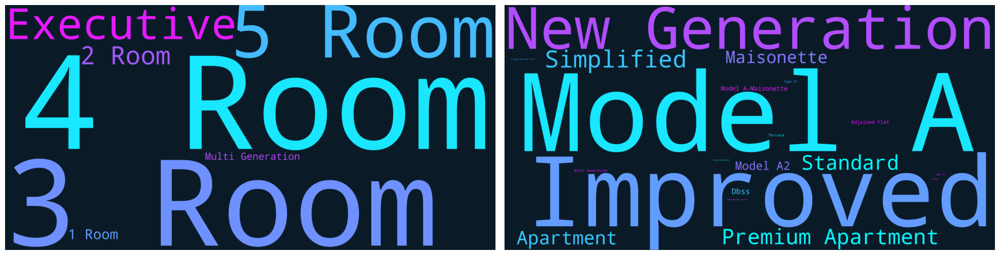

In [51]:
Flat_type = Counter(df1['flat_type'])
Flat_model = Counter(df1['flat_model'])

wordCloud_Flat_type = WordCloud(width= 5000, height = 2500, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_type.generate_from_frequencies(Flat_type)

# Add this line to create wordCloud_Flat_model
wordCloud_Flat_model = WordCloud(width= 5000, height = 2500, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_model.generate_from_frequencies(Flat_model)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_Flat_type, interpolation='bilinear',cmap='Blues')
plt.subplot(1,2,2)
plt.imshow(wordCloud_Flat_model, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
plt.show()

#### Frequency of Town and Storey

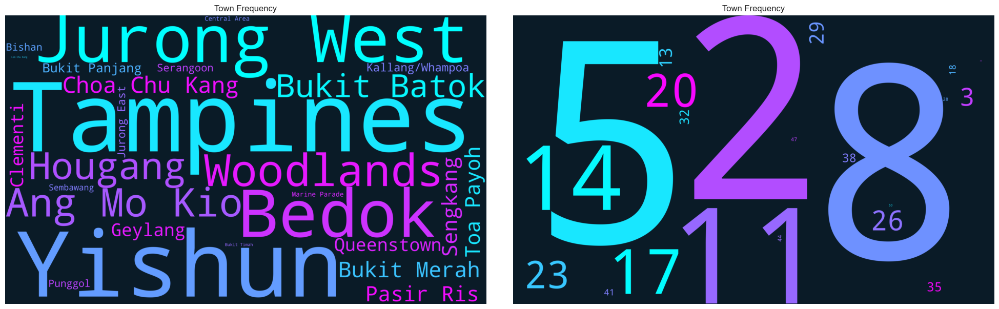

In [52]:
town = Counter(df1['town'])
full_address = Counter(df['Avg_storey_range'].astype('str'))

wordCloud_town = WordCloud(width= 5000, height = 3000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_town.generate_from_frequencies(town)

# Add this line to create wordCloud_Flat_model
wordCloud_full_address = WordCloud(width= 5000, height = 3000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_full_address.generate_from_frequencies(full_address)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_town, interpolation='bilinear',cmap='Blues')
plt.title('Town Frequency')
plt.subplot(1,2,2)
plt.imshow(wordCloud_full_address, interpolation='bilinear')
plt.title('Town Frequency')
plt.axis('off')
plt.tight_layout()
plt.show()

###   Resale Price Analysis 

In [53]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.formula.api import ols
import statsmodels.api as sm

def analyze_categorical_relationship(df, continuous_var, categorical_var):
    # Perform one-way ANOVA
    model = ols(f'{continuous_var} ~ C({categorical_var})', data=df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    
    # Calculate eta-squared (effect size)
    ssr = anova_table.loc['C(' + categorical_var + ')', 'sum_sq']
    sst = ssr + anova_table.loc['Residual', 'sum_sq']
    eta_squared = ssr / sst
    
    # Convert eta-squared to percentage
    significance_percentage = eta_squared * 100
    
    # Determine if there's a significant relationship
    p_value = anova_table.loc['C(' + categorical_var + ')', 'PR(>F)']
    alpha = 0.05  # significance level
    is_significant = p_value < alpha
    
    print(f"Relationship between {continuous_var} and {categorical_var}:")
    print(f"ANOVA: F-statistic = {anova_table.loc['C(' + categorical_var + ')', 'F']:.4f}, p-value = {p_value:.4f}")
    print(f"{categorical_var} has {significance_percentage:.2f}% significance with {continuous_var}")
    print(f"There is {'a' if is_significant else 'no'} statistically significant relationship between {categorical_var} and {continuous_var}.")
    print()
    
# Analyze relationships

for cat_var in categorical:
    analyze_categorical_relationship(df, 'resale_price', cat_var)

Relationship between resale_price and year:
ANOVA: F-statistic = 30875.3446, p-value = 0.0000
year has 53.09% significance with resale_price
There is a statistically significant relationship between year and resale_price.

Relationship between resale_price and month_number:
ANOVA: F-statistic = 49.4007, p-value = 0.0000
month_number has 0.06% significance with resale_price
There is a statistically significant relationship between month_number and resale_price.

Relationship between resale_price and town:
ANOVA: F-statistic = 3585.7858, p-value = 0.0000
town has 9.13% significance with resale_price
There is a statistically significant relationship between town and resale_price.

Relationship between resale_price and flat_type:
ANOVA: F-statistic = 83626.7422, p-value = 0.0000
flat_type has 35.11% significance with resale_price
There is a statistically significant relationship between flat_type and resale_price.

Relationship between resale_price and flat_model:
ANOVA: F-statistic = 1607

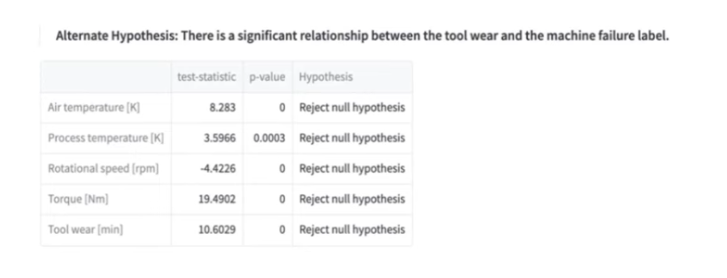

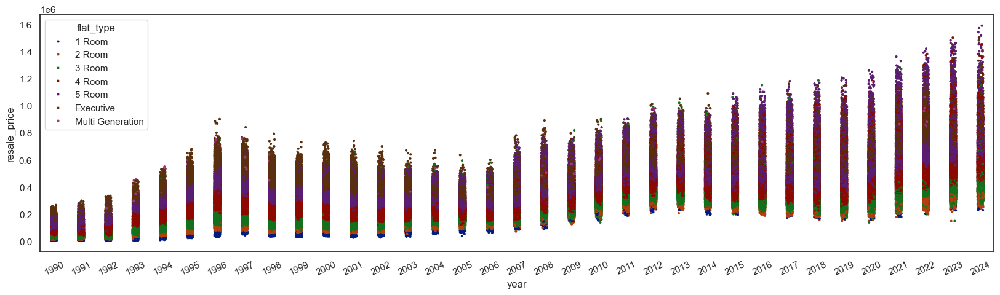

In [54]:
plt.figure(figsize=(20, 5))
sns.stripplot(data=df1, x="year", y="resale_price", hue="flat_type",palette='dark',s=3)
plt.xticks(rotation=25)
plt.show()

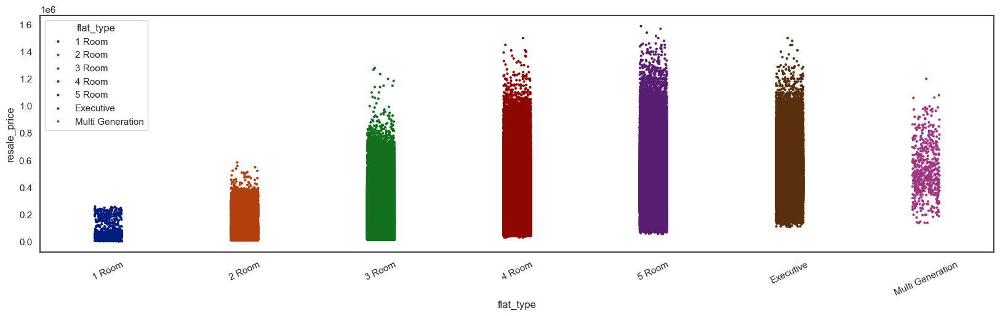

In [55]:
plt.figure(figsize=(20, 5))
sns.stripplot(data=df1, x="flat_type", y="resale_price", hue="flat_type",palette='dark',s=3, legend=True)
plt.xticks(rotation=25)
plt.show()

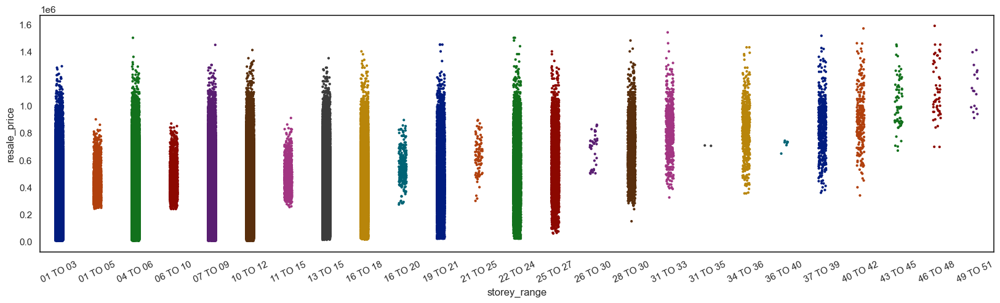

In [56]:
plt.figure(figsize=(20, 5))
sns.stripplot(data=df1, x="storey_range", y="resale_price", hue="storey_range",palette='dark',s=3, legend=False)
plt.xticks(rotation=25)
plt.show()

### Floor Area SQM Analysis 

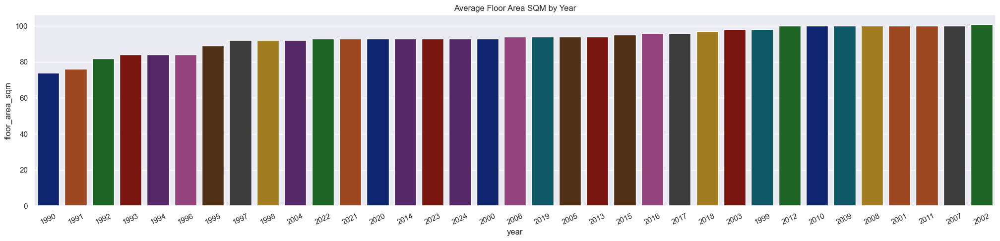

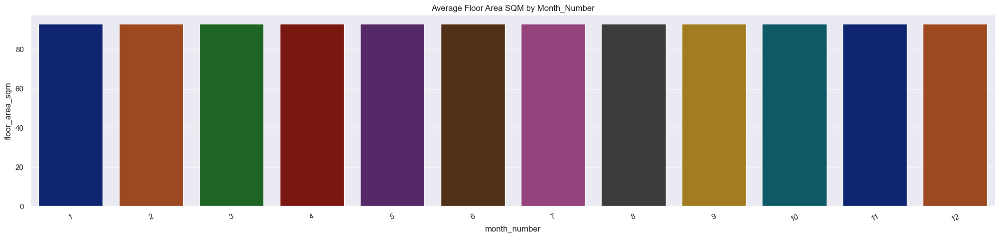

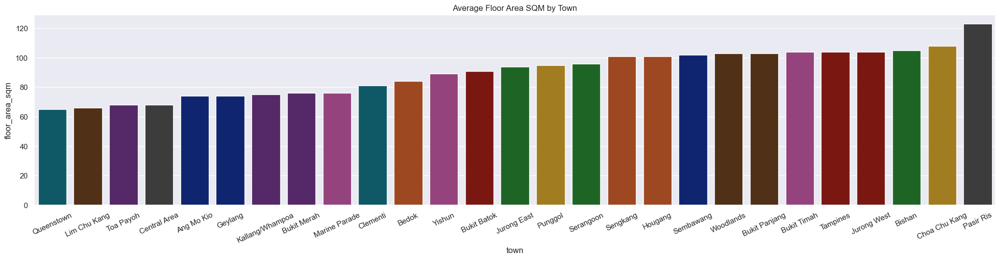

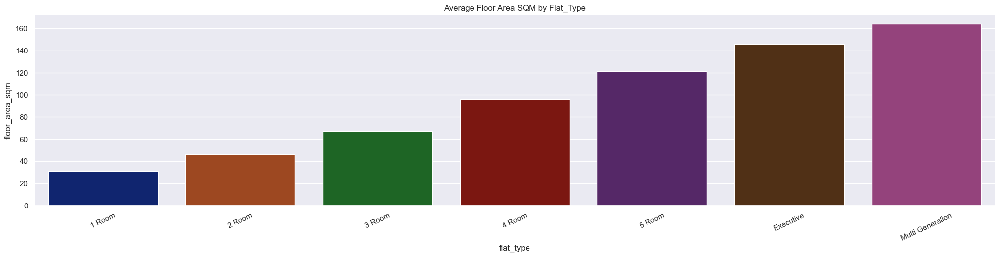

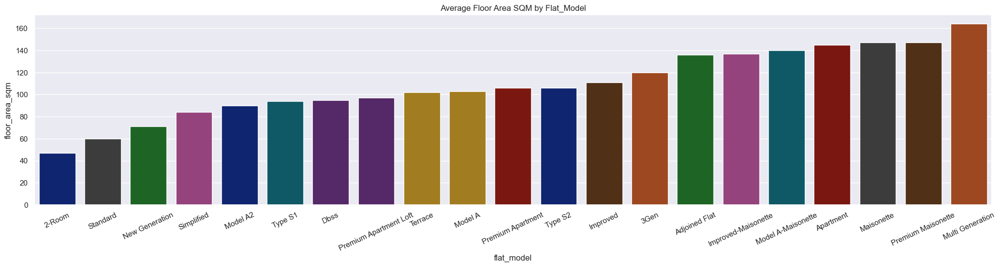

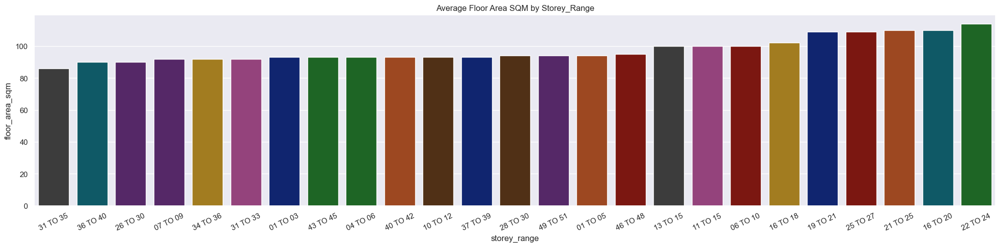

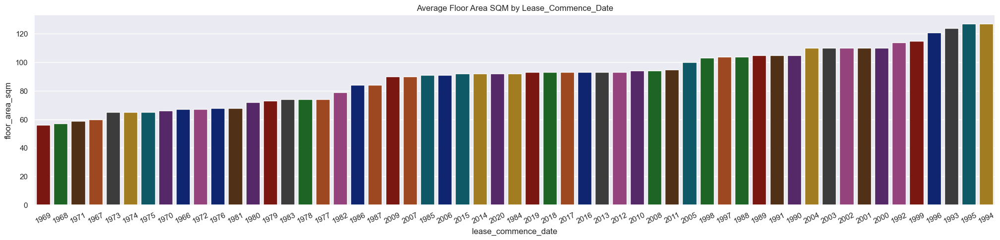

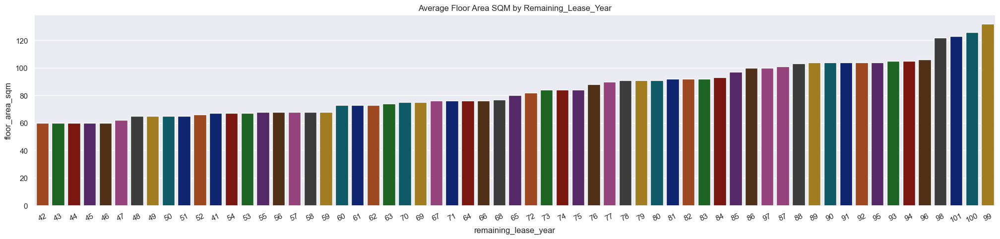

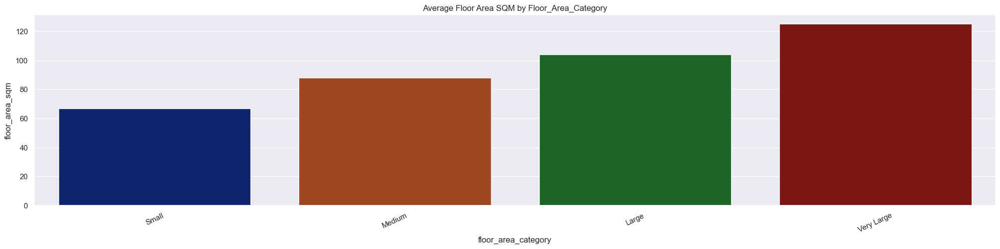

In [57]:
sns.set_theme( font_scale=1)  
# categorical.remove('floor_area_sqm')
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['floor_area_sqm'].median().reset_index().sort_values('floor_area_sqm')
    sns.barplot(data=data, x=data[i], y=data['floor_area_sqm'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average Floor Area SQM by {i.title()}')
    plt.show()
# categorical.append('floor_area_sqm')

### Relationship Between Continuous Features and Target

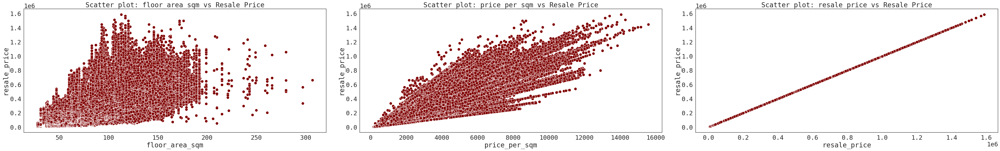

In [73]:
import math
sns.set_theme(context='notebook', style='white', palette='dark', font='DeJaVu Sans Mono', font_scale=2,color_codes=True, rc=None)
total_var=len(continuous)
plot_col=3
plot_row=math.ceil(total_var / 3)

fig, axes = plt.subplots(plot_row, plot_col, figsize=(50, 8))
axes = axes.flatten()
for i, var in  enumerate(continuous):
    sns.scatterplot(data=df1, x=var, y="resale_price", color='maroon',ax=axes[i],s=100)
    axes[i].set_title(f'Scatter plot: {var} vs Resale Price')

for i in range(i + 1, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1,color_codes=True, rc=None)


### Relationship Between Categorical Features and Target

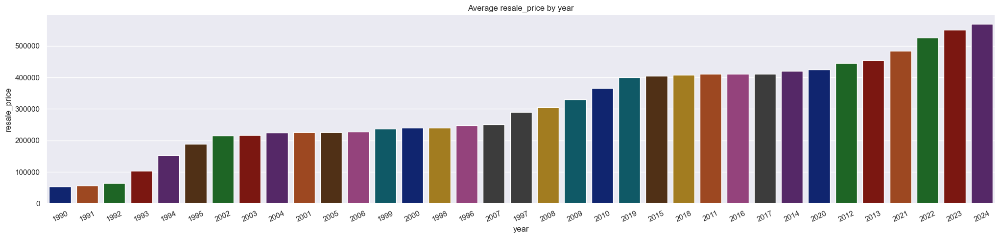

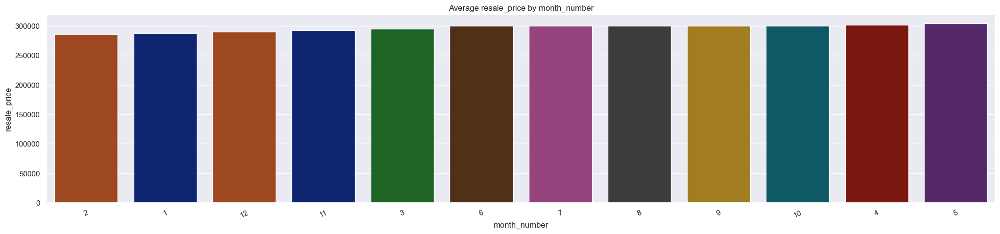

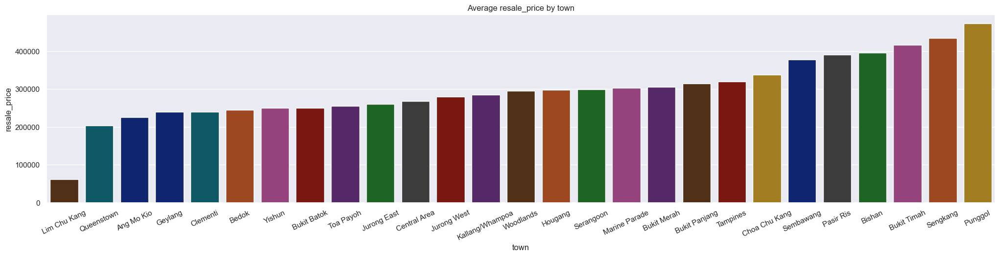

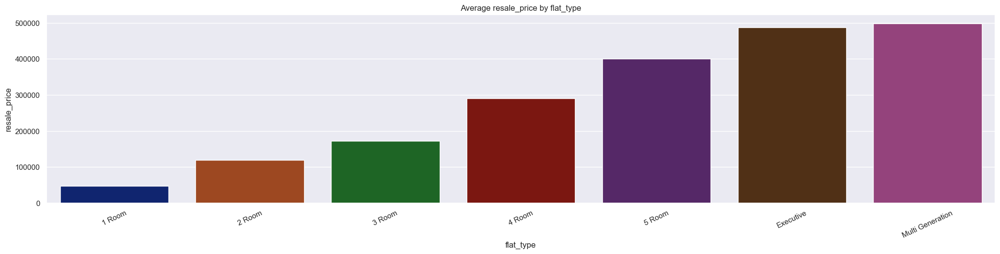

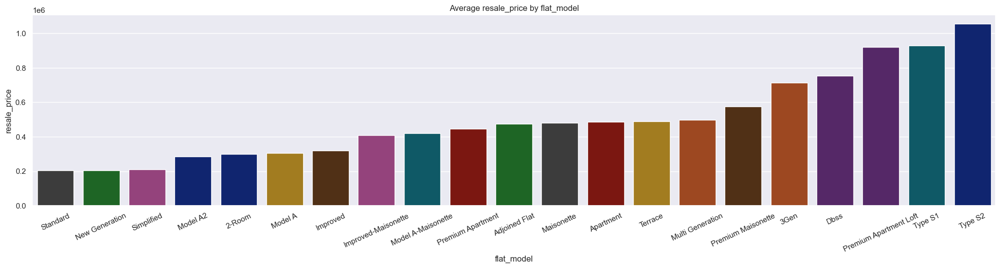

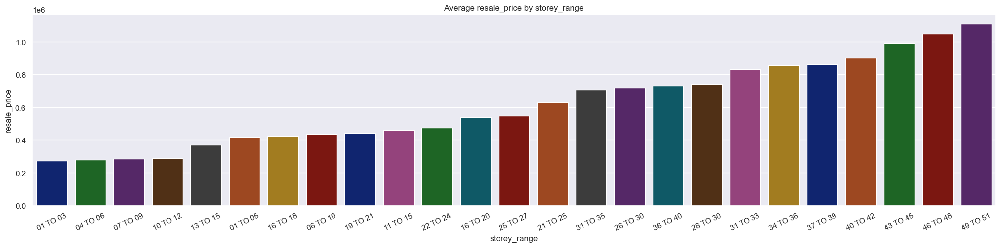

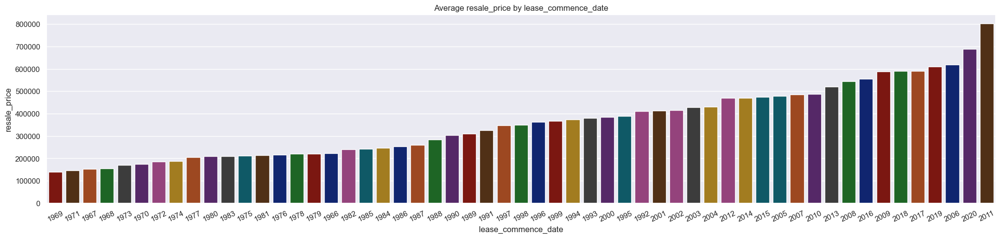

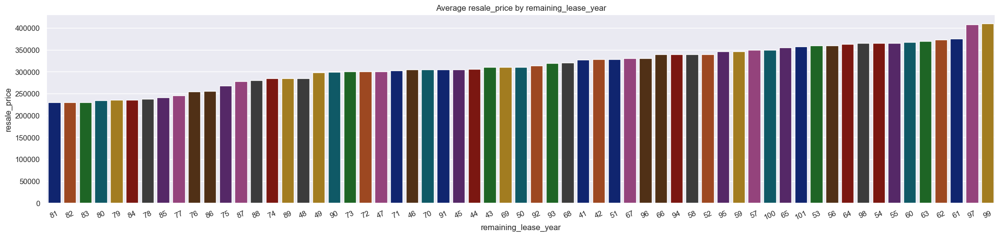

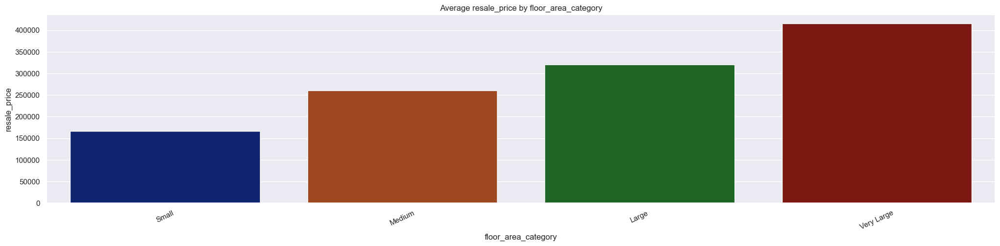

In [59]:
sns.set_theme( font_scale=1)  
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['resale_price'].median().reset_index().sort_values('resale_price')
    sns.barplot(data=data, x=data[i], y=data['resale_price'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average resale_price by {i}')
    plt.show()

### Pair Plot

<Figure size 1800x2000 with 0 Axes>

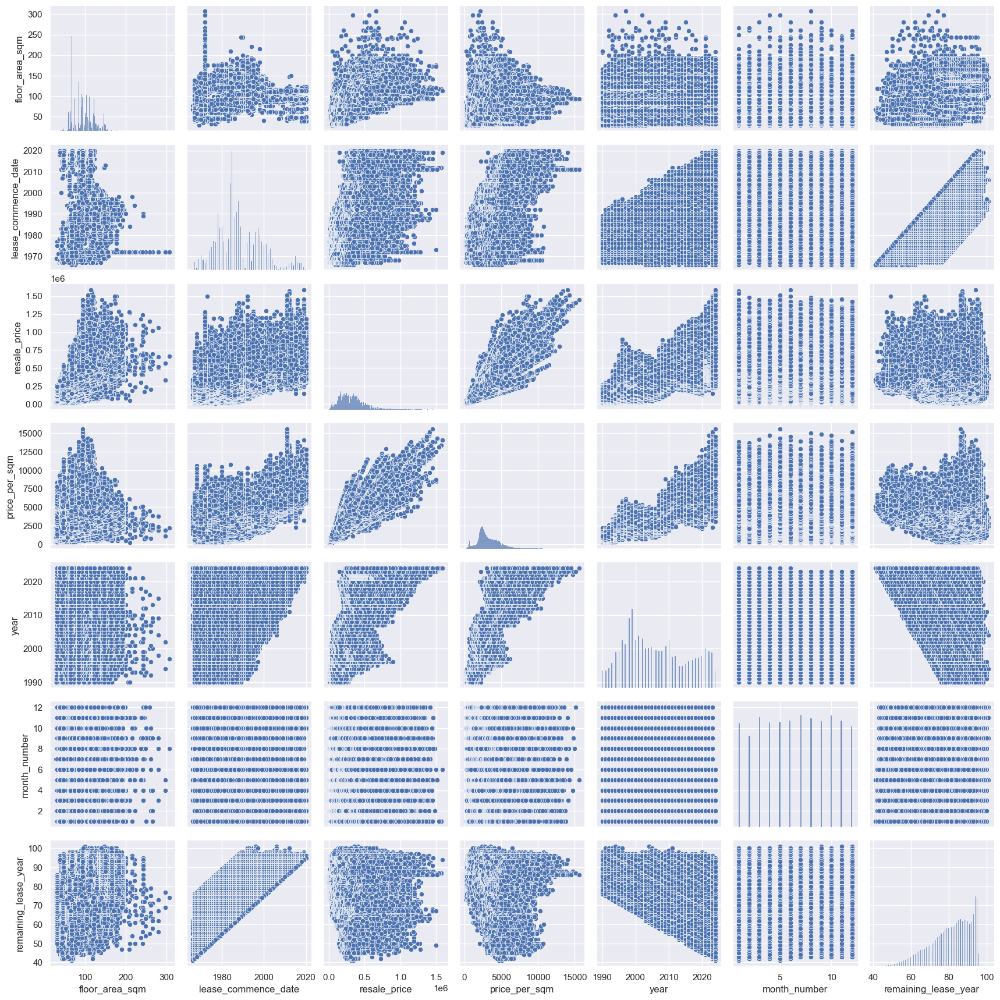

In [66]:
plt.figure(figsize=(18,20))
sns.pairplot(data=df1)
plt.show()

### Resale Price by Flat Type and Lease Commence Date

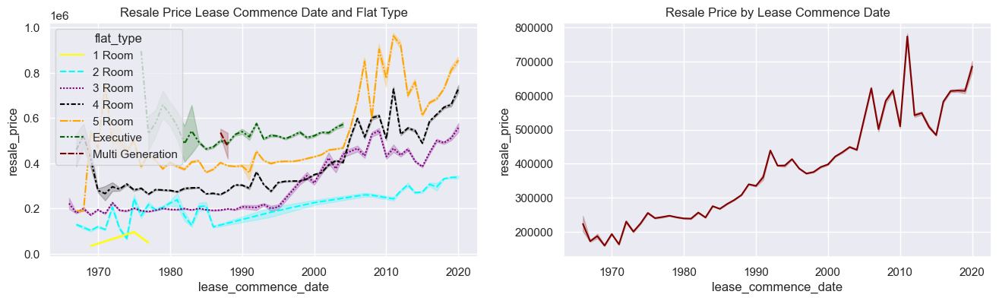

In [82]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Lease Commence Date and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',color='maroon')
plt.title("Resale Price by Lease Commence Date")

plt.show()

### Resale Price by Year and Flat Type

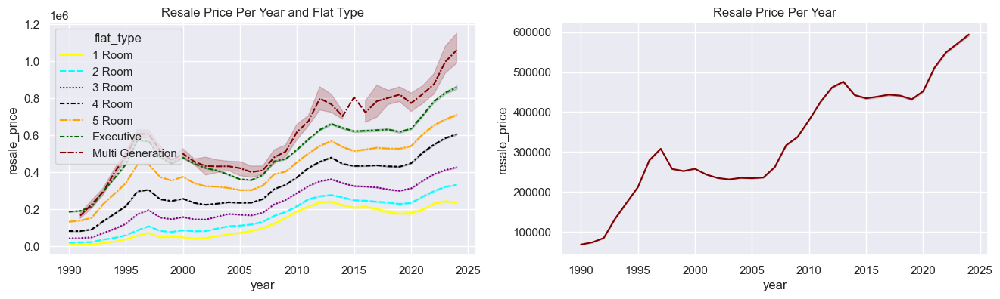

In [83]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='year', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Per Year and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Resale Price by Avg_storey_range and Flat Type

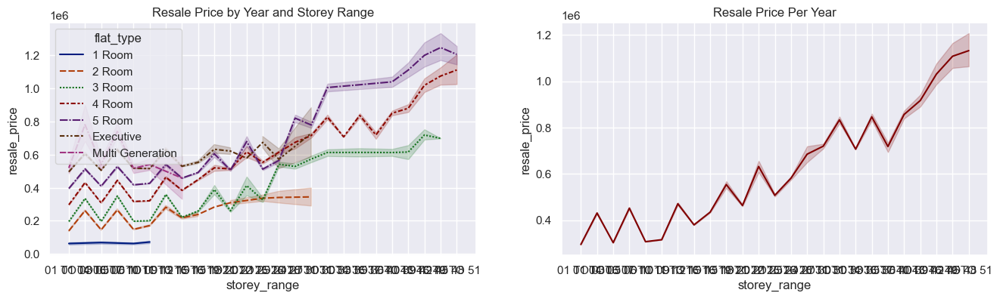

In [60]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='storey_range', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='storey_range', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Resale Price by remaining_lease_year and Flat Type

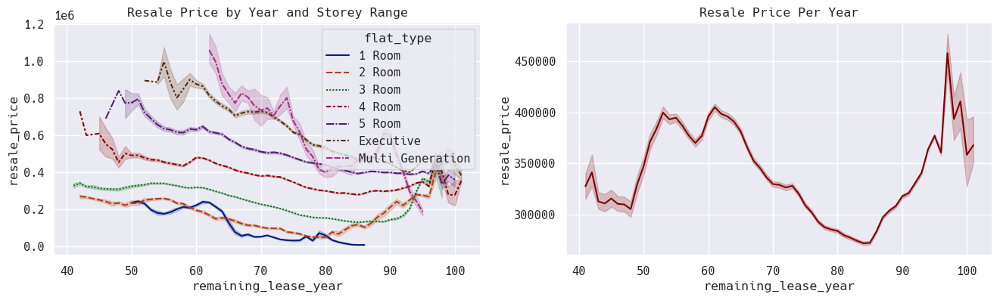

In [75]:
sns.set_theme( font_scale=1,font='Hack Nerd Font')

plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Normality Test

In [63]:
continuous = ['floor_area_sqm', 'price_per_sqm', 'resale_price',]

for var in continuous:
    stat, p = kstest(df1[var], 'norm', args=(df1[var].mean(), df1[var].std()))
    print(f'K-S Test for {var}: Statistics={stat}, p={p}')
    if p > 0.05:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')


K-S Test for floor_area_sqm: Statistics=0.09941099273674198, p=0.0
floor_area_sqm does not look normally distributed.

K-S Test for price_per_sqm: Statistics=0.09489535653294501, p=0.0
price_per_sqm does not look normally distributed.

K-S Test for resale_price: Statistics=0.059450367412785865, p=0.0
resale_price does not look normally distributed.



In [64]:
from scipy.stats import skew, kurtosis

for var in continuous:
    skewness = skew(df1[var])
    kurt = kurtosis(df1[var])
    print(f'{var} - Skewness: {skewness}, Kurtosis: {kurt}')
    if abs(skewness) < 0.5 and abs(kurt) < 3:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')

floor_area_sqm - Skewness: 0.3660709490993199, Kurtosis: -0.34641220087085633
floor_area_sqm looks normally distributed.

price_per_sqm - Skewness: 1.0728419731408791, Kurtosis: 2.0848609936408025
price_per_sqm does not look normally distributed.

resale_price - Skewness: 0.9421620158728324, Kurtosis: 1.373502157753908
resale_price does not look normally distributed.



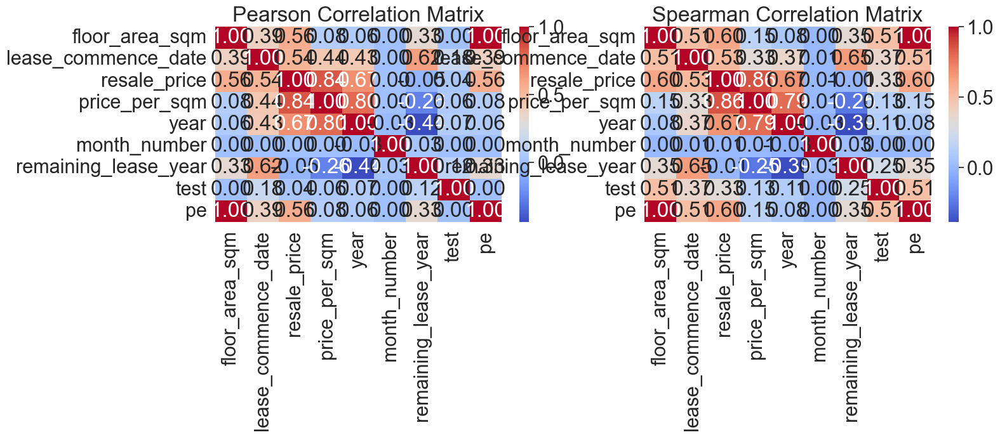

In [65]:
cor_col = df1.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Pearson Correlation Matrix')


cor_col = df1.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
plt.subplot(1,2,2)
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Spearman Correlation Matrix')
plt.show()

### Experimenting with a few types of data transformation techniques to see which one suits best.

In [66]:
skew_dict=dict(df1[continuous].skew())
skew_dict

{'floor_area_sqm': 0.3660726547241211,
 'price_per_sqm': 1.072843708264345,
 'resale_price': 0.942163539645637}

In [67]:
def boxcox_transform(x):
    # Perform Box-Cox transformation
    transformed_data,lmbda = boxcox(x)
    return transformed_data,lmbda

In [68]:
method_functions =  {
    'log': np.log,
    'square': np.sqrt,
    'rec': lambda x: 1 / x,
    'sig': lambda x: 1 / (1 + np.exp(-x)),
    'pow': lambda x: np.power(x, 2),
    'exp':lambda x: x**(1/5),
    'boxcox': boxcox_transform,
        }

def skewness_checker(df, column, method):
    normalized_df=pd.DataFrame()

    for method_name, func in method_functions.items():
        for col in column:

            new_column = f'{col}_{method_name}'
            if method_name in ['boxcox']:
                transformed_values = func(df[col])[0]
            else:
                transformed_values = func(df[col])
            normalized_df[new_column] = transformed_values

    return normalized_df

In [69]:
normalized_df=skewness_checker(df1, continuous, method_functions)
normalized_df

,floor_area_sqm_log,price_per_sqm_log,resale_price_log,floor_area_sqm_square,price_per_sqm_square,resale_price_square,floor_area_sqm_rec,price_per_sqm_rec,resale_price_rec,floor_area_sqm_sig,...,resale_price_sig,floor_area_sqm_pow,price_per_sqm_pow,resale_price_pow,floor_area_sqm_exp,price_per_sqm_exp,resale_price_exp,floor_area_sqm_boxcox,price_per_sqm_boxcox,resale_price_boxcox
0,3.433987,5.670993,9.104980,5.567764,17.038855,94.868330,0.032258,0.003444,0.000111,1.0,...,1.0,961.0,8.428720e+04,8.100000e+07,1.987341,3.108681,6.178009,6.593803,21.894497,121.361716
1,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,0.000167,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.593803,18.221192,101.219209
2,3.433987,5.553210,8.987197,5.567764,16.064387,89.442719,0.032258,0.003875,0.000125,1.0,...,1.0,961.0,6.659729e+04,6.400000e+07,1.987341,3.036307,6.034176,6.593803,20.764940,115.137050
3,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,0.000167,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.593803,18.221192,101.219209
4,4.290460,6.471690,10.762149,8.544003,25.427846,217.255610,0.013699,0.001547,0.000021,1.0,...,1.0,5329.0,4.180597e+05,2.227840e+09,2.358656,3.648580,8.605744,9.865798,31.172901,253.461991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181257,4.718499,8.793200,13.511699,10.583005,81.174415,859.069264,0.008929,0.000152,0.000001,1.0,...,1.0,12544.0,4.341869e+07,5.446440e+11,2.569470,5.804538,14.914588,11.902491,83.257104,851.806525
181258,4.804021,8.625827,13.429848,11.045361,74.657689,824.621125,0.008197,0.000179,0.000001,1.0,...,1.0,14884.0,3.106692e+07,4.624000e+11,2.613798,5.613449,14.672421,12.346850,77.667050,821.690977
181259,4.983607,8.596182,13.579788,12.083046,73.559220,888.819442,0.006849,0.000185,0.000001,1.0,...,1.0,21316.0,2.927848e+07,6.241000e+11,2.709384,5.580265,15.119082,13.323874,76.715625,877.695601
181260,4.983607,8.831904,13.815511,12.083046,82.760589,1000.000000,0.006849,0.000146,0.000001,1.0,...,1.0,21316.0,4.691312e+07,1.000000e+12,2.709384,5.849644,15.848932,13.323874,84.604298,973.536281


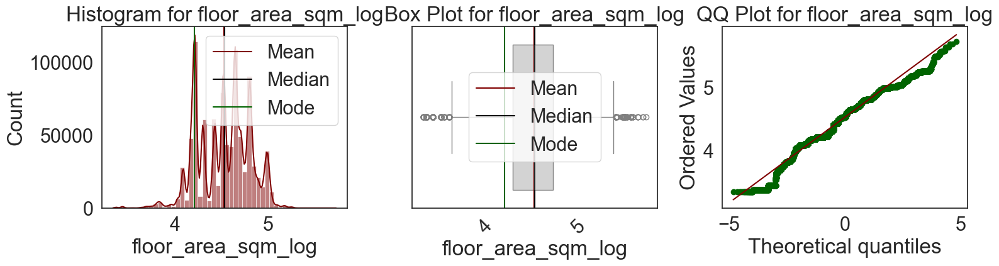



Skew for floor_area_sqm_log is -0.23

Kurtosis for floor_area_sqm_log is -0.36




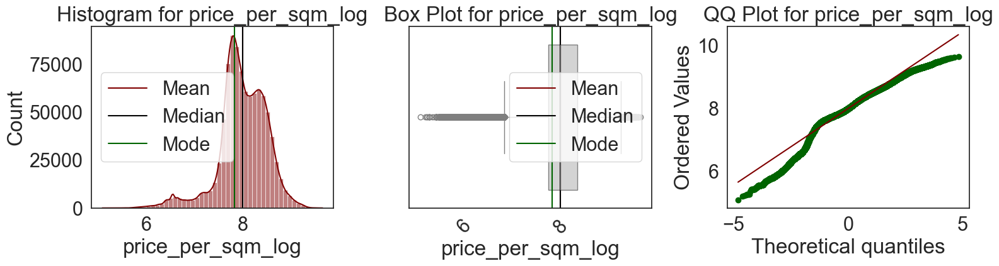



Skew for price_per_sqm_log is -0.82

Kurtosis for price_per_sqm_log is 1.87




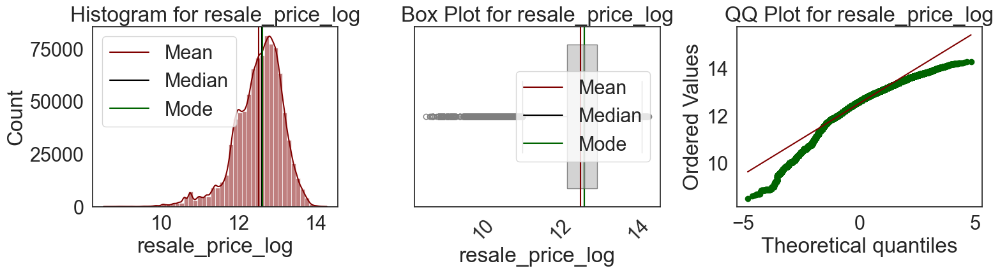



Skew for resale_price_log is -0.92

Kurtosis for resale_price_log is 1.61




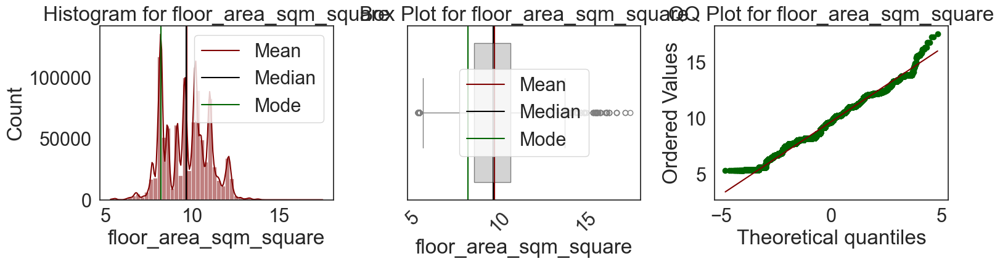



Skew for floor_area_sqm_square is 0.08

Kurtosis for floor_area_sqm_square is -0.57




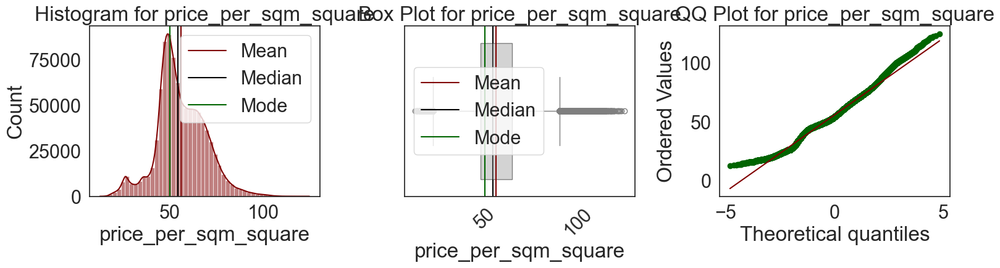



Skew for price_per_sqm_square is 0.22

Kurtosis for price_per_sqm_square is 0.57




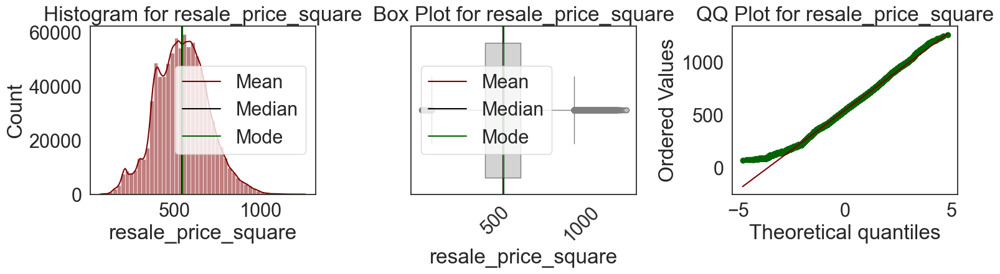



Skew for resale_price_square is 0.11

Kurtosis for resale_price_square is 0.05




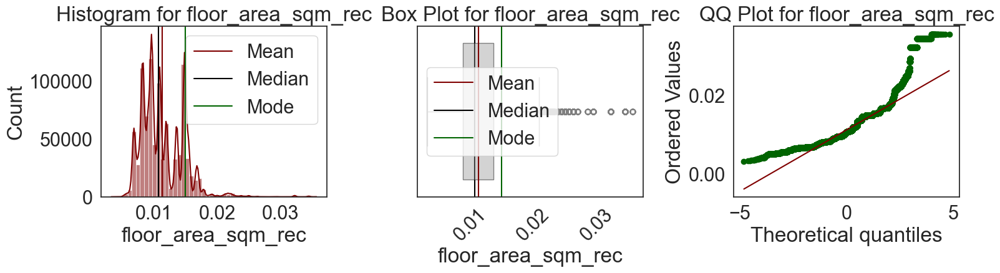



Skew for floor_area_sqm_rec is 1.10

Kurtosis for floor_area_sqm_rec is 3.00




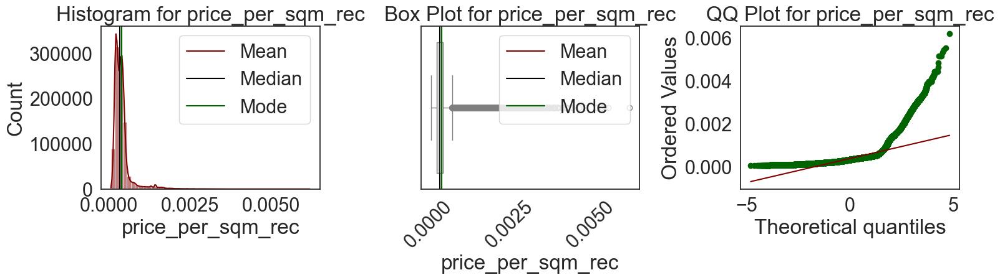



Skew for price_per_sqm_rec is 4.09

Kurtosis for price_per_sqm_rec is 24.62




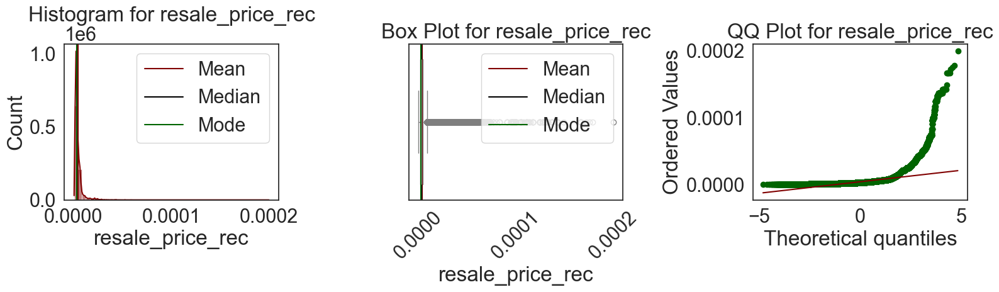



Skew for resale_price_rec is 7.24

Kurtosis for resale_price_rec is 112.40




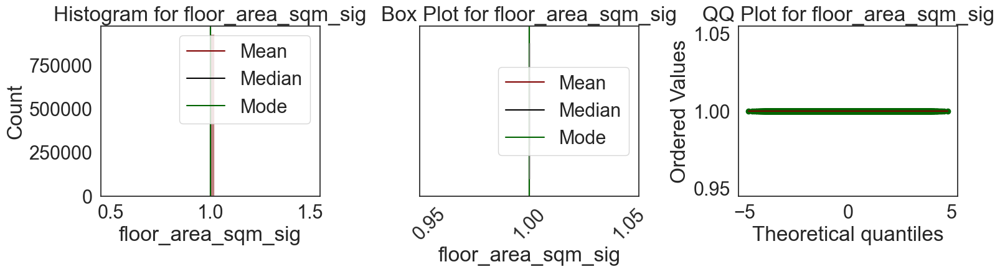



Skew for floor_area_sqm_sig is 0.00

Kurtosis for floor_area_sqm_sig is 0.00




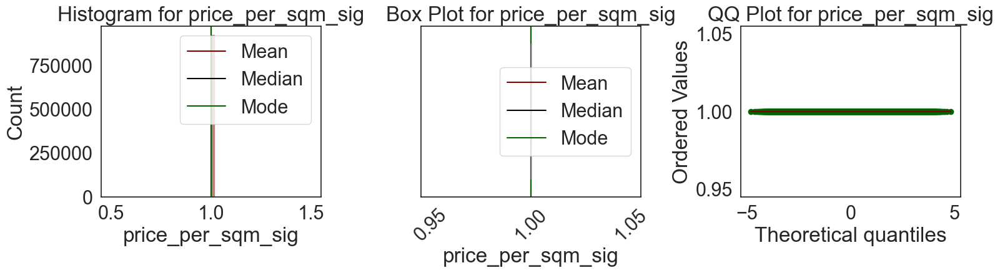



Skew for price_per_sqm_sig is 0.00

Kurtosis for price_per_sqm_sig is 0.00




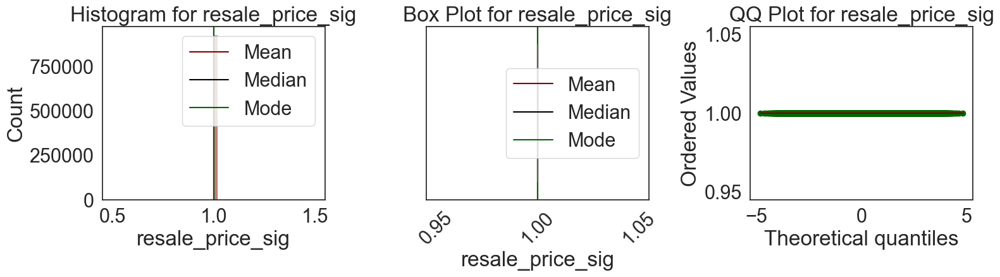



Skew for resale_price_sig is 0.00

Kurtosis for resale_price_sig is 0.00




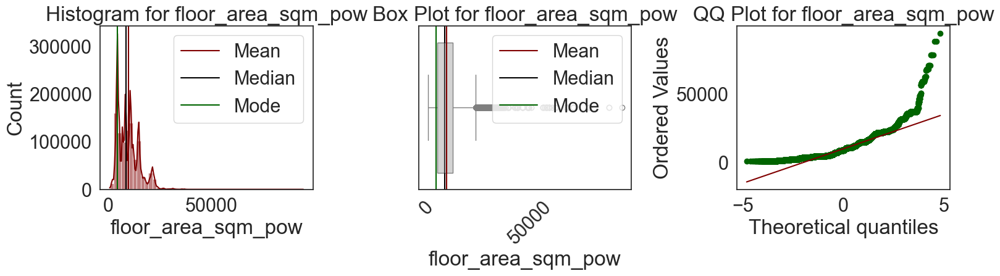



Skew for floor_area_sqm_pow is 1.00

Kurtosis for floor_area_sqm_pow is 1.66




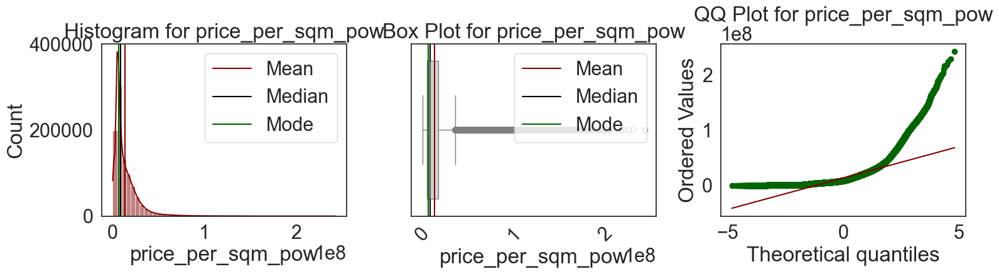



Skew for price_per_sqm_pow is 2.99

Kurtosis for price_per_sqm_pow is 14.96




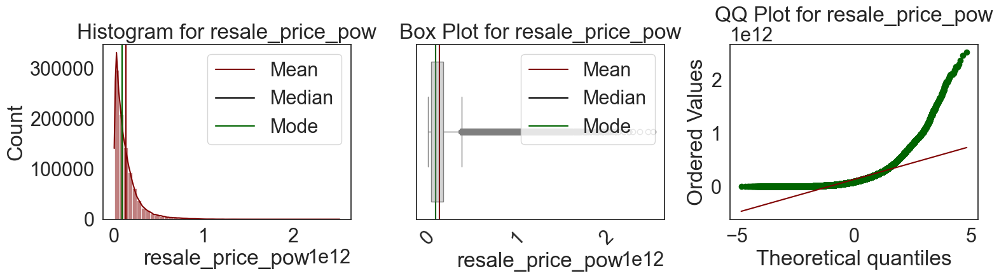



Skew for resale_price_pow is 2.81

Kurtosis for resale_price_pow is 13.23




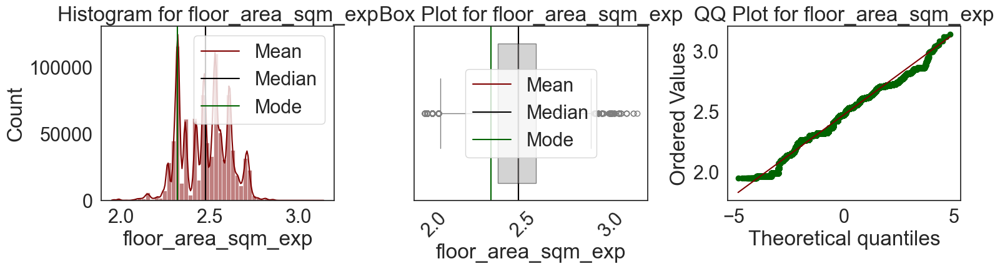



Skew for floor_area_sqm_exp is -0.11

Kurtosis for floor_area_sqm_exp is -0.50




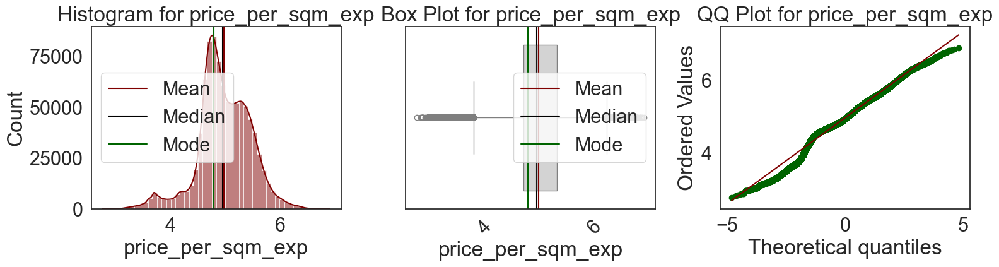



Skew for price_per_sqm_exp is -0.37

Kurtosis for price_per_sqm_exp is 0.93




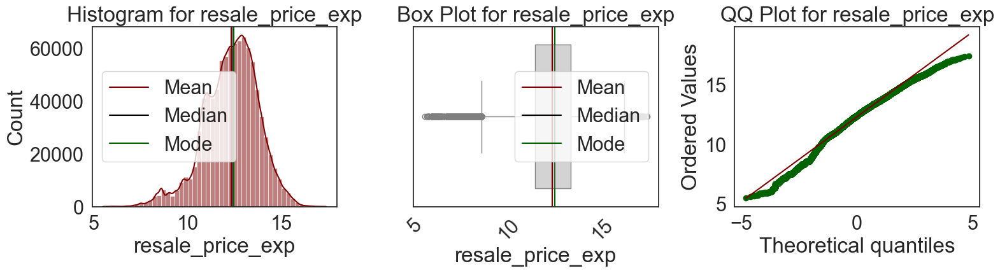



Skew for resale_price_exp is -0.46

Kurtosis for resale_price_exp is 0.48




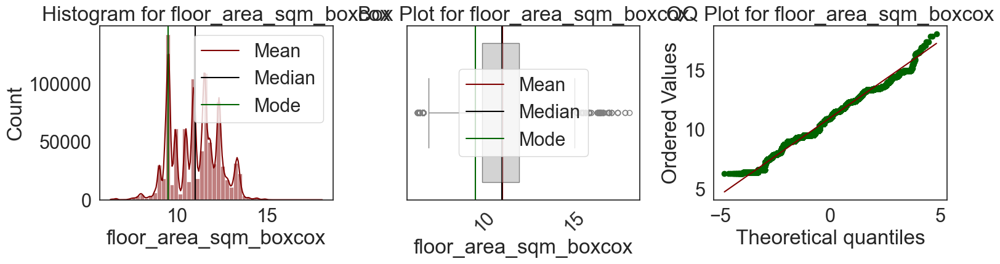



Skew for floor_area_sqm_boxcox is -0.02

Kurtosis for floor_area_sqm_boxcox is -0.55




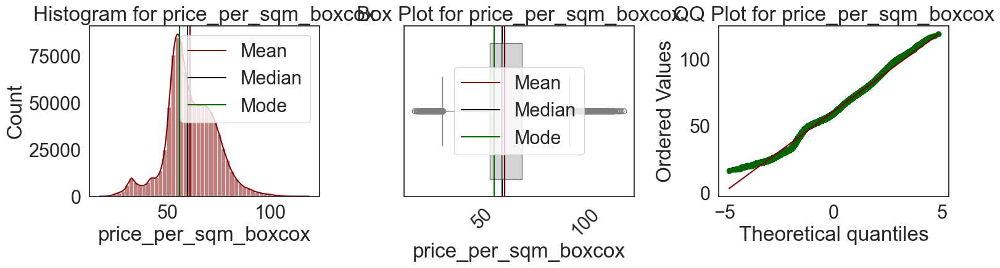



Skew for price_per_sqm_boxcox is 0.04

Kurtosis for price_per_sqm_boxcox is 0.57




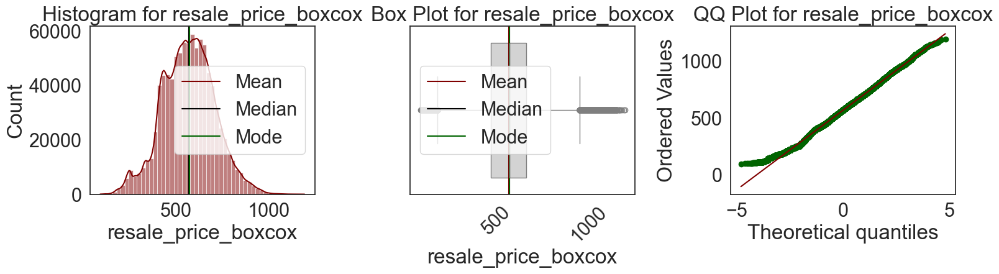



Skew for resale_price_boxcox is -0.00

Kurtosis for resale_price_boxcox is 0.05


Skewness:
 {'floor_area_sqm_log': -0.23334388, 'price_per_sqm_log': -0.8184514040088072, 'resale_price_log': -0.9240431018462136, 'floor_area_sqm_square': 0.07508402, 'price_per_sqm_square': 0.218400005682388, 'resale_price_square': 0.10918464819090822, 'floor_area_sqm_rec': 1.1036736, 'price_per_sqm_rec': 4.092842125511875, 'resale_price_rec': 7.24332894254145, 'floor_area_sqm_sig': 0.0, 'price_per_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.0026332, 'price_per_sqm_pow': 2.9859800621469907, 'resale_price_pow': 2.810519042318628, 'floor_area_sqm_exp': -0.10569635, 'price_per_sqm_exp': -0.3680042268192765, 'resale_price_exp': -0.4641821320745675, 'floor_area_sqm_boxcox': -0.016471082, 'price_per_sqm_boxcox': 0.037947014786446534, 'resale_price_boxcox': -0.0005540558944127643} 

 Kurtois:
 {'floor_area_sqm_log': -0.35770032, 'price_per_sqm_log': 1.868267357554061, 'resale_price_log': 1

In [70]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df.columns:
    univar_num(normalized_df,i)
    skews=normalized_df[i].skew()
    kurt=normalized_df[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

In [ ]:
df1[df1.storey_range]

## Handling Outliers

### Function to handle outliers based on categorical variables

In [99]:
def handle_outliers(df, continuous_var, categorical_vars, iqr_multiplier=1.5):
    df_copy = df.copy()
    outlier_count = 0
    
    # Group by all categorical variables at once
    grouped = df_copy.groupby(categorical_vars,observed=True)
    
    def replace_outliers(group):
        nonlocal outlier_count
        Q1 = group[continuous_var].quantile(0.25)
        Q3 = group[continuous_var].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - iqr_multiplier * IQR
        upper_bound = Q3 + iqr_multiplier * IQR
        
        # Count outliers
        outliers = (group[continuous_var] < lower_bound) | (group[continuous_var] > upper_bound)
        outlier_count += outliers.sum()
        
        # Cap outliers instead of replacing with median
        group.loc[group[continuous_var] < lower_bound, continuous_var] = lower_bound
        group.loc[group[continuous_var] > upper_bound, continuous_var] = upper_bound
        
        return group[continuous_var]

    # Apply the function and update only the continuous variable
    df_copy[continuous_var] = grouped[continuous_var].transform(replace_outliers)
    
    print(f"Total outliers handled: {outlier_count}")
    return df_copy

### List of categorical variables that influence resale_price

In [95]:
categorical_vars = ['year','flat_type','town']

### Apply the function to handle outliers

In [96]:
df1.columns

Index(['town', 'flat_type', 'floor_area_sqm', 'storey_range', 'flat_model',
       'lease_commence_date', 'resale_price', 'floor_area_category',
       'price_per_sqm', 'year', 'month_number', 'full_address',
       'remaining_lease_year', 'test', 'pe'],
      dtype='object')

In [97]:
df1['full_address'] = df1['full_address'].astype('category')
df1['floor_area_sqm'] = pd.to_numeric(df1['floor_area_sqm'], errors='coerce')
df1['floor_area_sqm'] = df1['floor_area_sqm'].astype('float')
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 15 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   town                  927465 non-null  category
 1   flat_type             927465 non-null  category
 2   floor_area_sqm        927465 non-null  float64 
 3   storey_range          927465 non-null  category
 4   flat_model            927465 non-null  category
 5   lease_commence_date   927465 non-null  int32   
 6   resale_price          927465 non-null  float64 
 7   floor_area_category   927465 non-null  category
 8   price_per_sqm         927465 non-null  float64 
 9   year                  927465 non-null  int32   
 10  month_number          927465 non-null  int32   
 11  full_address          927465 non-null  category
 12  remaining_lease_year  927465 non-null  int32   
 13  test                  927465 non-null  int8    
 14  pe                    927465 non-null  fl

In [103]:
df1

,town,flat_type,floor_area_sqm,storey_range,flat_model,lease_commence_date,resale_price,floor_area_category,price_per_sqm,year,month_number,full_address,remaining_lease_year,test,pe
0,Ang Mo Kio,1 Room,31.0,10 TO 12,Improved,1977,9000.0,Small,290.322581,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
1,Ang Mo Kio,1 Room,31.0,04 TO 06,Improved,1977,6000.0,Small,193.548387,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
2,Ang Mo Kio,1 Room,31.0,10 TO 12,Improved,1977,8000.0,Small,258.064516,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
3,Ang Mo Kio,1 Room,31.0,07 TO 09,Improved,1977,6000.0,Small,193.548387,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
4,Ang Mo Kio,3 Room,73.0,04 TO 06,New Generation,1976,47200.0,Small,646.575342,1990,1,216 Ang Mo Kio Ave 1 Ang Mo Kio,85,3,73.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181257,Yishun,5 Room,112.0,10 TO 12,Improved,2018,738000.0,Large,6589.285714,2024,6,502B Yishun St 51 Yishun,93,5,112.0
181258,Yishun,5 Room,122.0,07 TO 09,Improved,1988,680000.0,Very Large,5573.770492,2024,6,865 Yishun St 81 Yishun,63,5,122.0
181259,Yishun,Executive,146.0,10 TO 12,Maisonette,1986,790000.0,Very Large,5410.958904,2024,6,723 Yishun St 71 Yishun,61,0,146.0
181260,Yishun,Executive,146.0,10 TO 12,Maisonette,1988,1000000.0,Very Large,6849.315068,2024,6,826 Yishun St 81 Yishun,63,0,146.0


In [110]:
grouped = df1.groupby(categorical_vars,observed=True)
# print(list(grouped))

In [102]:
# df1_cleaned = handle_outliers(df1, 'resale_price', categorical_vars)
# df1_cleaned = handle_outliers(df1, 'floor_area_sqm', categorical_vars)
df1_cleaned = handle_outliers(df1, 'resale_price', categorical_vars)

KeyError: 'resale_price'

## Exploratory Data Analysis. After Handling Skewness and Outliers

In [ ]:
df1_cleaned.describe().T

In [ ]:
color_good = '\033[32m'  # Dark Green for good skew
color_okay = '\033[92m'  # Light Green for okay skew
color_bad = '\033[91m'  # Maroon for bad skew
color_neutral = '\033[0m'  # Reset color

skewed_col = []

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  

for i in continuous:
    univar_num(df1_cleaned,i) 
    skew_val = df1_cleaned[i].skew()
    
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
        skewed_col.append(i)

    print(f"\n{color}Skew for {i} is {skew_val:.2f}{color_neutral}\n")

In [ ]:
normalized_df_cleaned=skewness_checker(df1_cleaned, continuous, method_functions)
normalized_df_cleaned

In [ ]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df_cleaned.columns:
    univar_num(normalized_df_cleaned,i)
    skews=normalized_df_cleaned[i].skew()
    kurt=normalized_df_cleaned[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

In [ ]:
df1.sample(5)

In [ ]:
df1.sample(5)